<div class="usecase-title">Assessing Parking Availability Around Cafe, Restaurant, Bistro seats, Bar, Tavern and Pubs</div>

<div class="usecase-authors"><b>Authored by: </b> Chathu Siriwardena</div>

<div class="usecase-duration"><b>Duration:</b> {90} mins</div>

<div class="usecase-level-skill">
    <div class="usecase-level"><b>Level: </b>{Intermediate}</div>
    <div class="usecase-skill"><b>Pre-requisite Skills: </b> Python, Data Wrangling, Data Visualization, Data Modeling, Machine Learning, Deep Learning, Geographical Coordinates Handling</div>
</div>

<div class="usecase-section-header">Scenario</div>
<br>This use case aims to evaluate the sufficiency of on-street parking around Cafe, restaurant, bistro seats, Bar, tavern, pub in Melbourne. By analyzing the locations of car parking meters, parking bays, and business establishments, the City of Melbourne can ensure adequate parking facilities to support local businesses and enhance visitor convenience. 


User Story

As a cafe owner, I want to know the availability of nearby parking spaces so that I can ensure my customers have convenient parking option.

As a restaurant manager, I want to know about the availability of nearby parking so that I can enhance the dining experience for my guests.

As a customer, I want to identify available parking spots so that I can easily visit the bistro without the frustration of a lengthy parking search.

As a council planner, I want to know the availability of nearby parking spaces around cafés so that we can ensure adequate parking infrastructure for the convenience of residents and visitors.

At the end of this use case you will:<br>
-Learn to import data sets using API v2.1 <br>
-Learn data manipulations and merging datasets<br>
-Learn data visualisation using  matplotlib, seaborn<br>
-Learn  to work with categorical locations and geolocations using geopy<br>
-Learn to plot Maps using folium <br> 
-Develop Scoring model and catogerise the parking availability based on the score calculation<br>
-Calculate the distance between each business location and the parking spots and identify the closest parking locations for given venue br>
-Develop Regression models and simple FFNN and evaluate them <br>



Data Sets Used:

-
Data Set 1 [Cafes and Restaurants with Seating Capacity](https://data.melbourne.vic.gov.au/explore/dataset/cafes-and-restaurants-with-seating-capacity/information/).<br> This data set contains Block ID, Property ID, Base property ID, Building address, CLUE small area, Trading name, Business address, Industry code, Industry description, Seating type, Number of seats, Longitude, Latitude and Location. The data set was used to identify the locations of the cafes and restaurants with their seating capacities. The dataset is imported from Melbourne Open Data website, using API V2





-
Data Set 2 [Bars and Pubs with Patron Capacity](https://data.melbourne.vic.gov.au/explore/dataset/bars-and-pubs-with-patron-capacity/information/).<br> This data set contains Block ID, Property ID, Base property ID, Building address, CLUE small area, Trading name, Business address, Number of patrons, Longitude, Latitude and Location. The data set was used to identify the locations of the Bars, tavern and pubs with their patron capacities. The dataset is imported from Melbourne Open Data website, using API V2





-
Data Set 3 [On Street Parking Bays](https://data.melbourne.vic.gov.au/explore/dataset/on-street-parking-bays/information/).<br> This data set contains Roadsegment id, Kerbside id, Roadsegment Description, Latitude, Longitude and Last updated . The data set was used to identify the locations of the parking bays within the city of Melbourn. The dataset is imported from Melbourne Open Data website, using API V2





-
Data Set 4 [On Street Car Parking Meters with Location](https://data.melbourne.vic.gov.au/explore/dataset/on-street-car-parking-meters-with-location/information/).<br> This data set contains Barcode, Credit card, Tap and go, Longitude, Latitude, Location,  Asset id, Meter id and Location Description. The data set was used to identify the locations of the parking meters within the City of Melbourne. The dataset is imported from Melbourne Open Data website, using API V2





Outline of the Use Case

1. Data Preprocessing

I Started use case by cleaning and preparing each dataset for analysis. This involves:

Handling missing values and duplicates: Remove or impute missing values in latitude, longitude, and other critical fields.
Geospatial alignment: Convert all datasets into a common format using latitude and longitude to enable spatial calculations.
Data merging: Merge datasets based on proximity to business locations (cafes, restaurants, etc.).

2. Data Visualization
-Interactive Maps: Used tools like Folium to create an interactive map showing the locations of cafes, restaurants, bars, and their proximity to parking meters and bays.
-Bar Charts, Stack bar charts, Pie charts, multiple bar charts and other graphs and tables: To identify the key insights

3. Feature Engineering

Next, I created features that will help the model understand the relationship between businesses and parking availability:

 - Distance from parking to business:Computed the distance between each business and the nearest parking bay or meter.
 - Number of nearby parking spaces: Counted the number of parking bays within a certain radius (e.g., 100 meters, 200 meters) around each business.
 - Type of business: Included categorical variables for the Industry type of business (cafe, restaurant, bar, etc.) and their seating/patron capacity.

4. Model Selection and Model Building

- Geospatial Clustering Model (Density-based):
  
   - DBSCAN: This clustering algorithm was used to group businesses based on the density of parking spaces around them. Areas with higher parking density would support more businesses, whereas areas with lower density might require parking interventions.
   - K-means: Clustered businesses analyze the distribution of parking availability across different clusters.

- Regression Model:
  - Multiple Linear Regression/GLM: Predicted the sufficiency of parking based on features like business type, seating capacity, number of nearby parking bays/meters, and distance to parking.
  - Logistic Regression: A binary model created to classify whether the parking is sufficient or insufficient based on the input features.

- Spatial Autoregressive Model (SAR):
  A spatial autoregressive model was used if there's a spatial dependency in the data (e.g., businesses close to each other may share parking resources).

- Random Forests/Gradient Boosting:
For more complex relationships, Random Forest or Gradient Boosting models used to predict parking sufficiency based on multiple features, including geospatial ones.

- Deep Learning Approach for Predicting Parking Accessibility with Custom Metrics (FFNN)

5. Model Evaluation Metrics
   
   Evaluated the model using below metrics:

 - Mean Absolute Error (MAE) / Mean Squared Error (MSE): For regression models to predict parking sufficiency.
 - Clustering metrics: Evaluated the density-based clusters using silhouette score.
 - Classification metrics: For logistic regression, use accuracy, precision, recall, and F1-score to assess the sufficiency of parking.

6. Outputs
  

 - Map of parking availability: Visualize parking availability by plotting parking bays/meters on a map and overlaying it with closest 5 business locations.
 - Proximity analysis: For each business, details on the number of near by parking spots with different distance.
 - Parking sufficiency Score and Catogerisation : Developed a scoring system to rank based on parking sufficiency score for each business






##### Importing Required Libraries



In [567]:
import requests
import pandas as pd
import numpy as np
from io import StringIO
import geopy
from geopy.geocoders import Nominatim
import folium
from ipywidgets import interact, widgets
from IPython.display import display
import seaborn as sns
import matplotlib.pyplot as plt
import re as re
from geopy.extra.rate_limiter import RateLimiter
import seaborn as sns
from geopy.distance import geodesic
from sklearn.cluster import KMeans,DBSCAN
from sklearn.preprocessing import MinMaxScaler,StandardScaler
import geopandas as gpd
from geopy.distance import great_circle
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, accuracy_score, precision_score, recall_score, f1_score, roc_curve, auc, silhouette_score
from sklearn.ensemble import RandomForestRegressor
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, BatchNormalization, LeakyReLU
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras import backend as K
from IPython.display import display, clear_output


##### Loading all Data sets



<div class="Data_Set">Data Set 1: Cafes and Restaurants with Seating Capacity.</div>


In [426]:
base_url='https://data.melbourne.vic.gov.au/api/explore/v2.1/catalog/datasets/'
dataset_id='cafes-and-restaurants-with-seating-capacity'


url=f'{base_url}{dataset_id}/exports/csv'
params={'select':'*','limit':-1,'lang':'en','timezone':'UTC'}

response=requests.get(url,params=params)

if response.status_code==200:
    url_content=response.content.decode('utf-8')
    cafes_df=pd.read_csv(StringIO(url_content),delimiter=';')
    print(cafes_df.head(10))
else:
    print(f'Request failed with status code {response.status_code}')

   census_year  block_id  property_id  base_property_id  \
0         2017         6       578324            573333   
1         2017         6       578324            573333   
2         2017        11       103957            103957   
3         2017        11       103957            103957   
4         2017        11       103985            103985   
5         2017        11       103987            103987   
6         2017        11       103993            103993   
7         2017        11       108971            108971   
8         2017        11       559405            559405   
9         2017        12       103955            103955   

                         building_address  clue_small_area  \
0        2 Swanston Street MELBOURNE 3000  Melbourne (CBD)   
1        2 Swanston Street MELBOURNE 3000  Melbourne (CBD)   
2    517-537 Flinders Lane MELBOURNE 3000  Melbourne (CBD)   
3    517-537 Flinders Lane MELBOURNE 3000  Melbourne (CBD)   
4  562-564 Flinders Street MELBOURNE 300

<div class="Data_Set">Data Set 2: Bars and Pubs with Patron Capacity.</div>


In [427]:
base_url='https://data.melbourne.vic.gov.au/api/explore/v2.1/catalog/datasets/'
dataset_id='bars-and-pubs-with-patron-capacity'


url=f'{base_url}{dataset_id}/exports/csv'
params={'select':'*','limit':-1,'lang':'en','timezone':'UTC'}

response=requests.get(url,params=params)

if response.status_code==200:
    url_content=response.content.decode('utf-8')
    bars_df=pd.read_csv(StringIO(url_content),delimiter=';')
    print(bars_df.head(10))
else:
    print(f'Request failed with status code {response.status_code}')

   census_year  block_id  property_id  base_property_id  \
0         2002        11       108972            108972   
1         2002        14       103172            103172   
2         2002        15       103944            103944   
3         2002        16       103938            103938   
4         2002        17       103925            103925   
5         2002        33       105937            105937   
6         2002        35       102143            102143   
7         2002        37       102158            102158   
8         2002        42       105392            105392   
9         2002        43       108069            108069   

                               building_address  clue_small_area  \
0           10-22 Spencer Street MELBOURNE 3000  Melbourne (CBD)   
1         31-39 Elizabeth Street MELBOURNE 3000  Melbourne (CBD)   
2          277-279 Flinders Lane MELBOURNE 3000  Melbourne (CBD)   
3              187 Flinders Lane MELBOURNE 3000  Melbourne (CBD)   
4         

<div class="usecase-section-header">Data Set 3: On Street Parking Bays</div>


In [428]:
base_url='https://data.melbourne.vic.gov.au/api/explore/v2.1/catalog/datasets/'
dataset_id='on-street-parking-bays'


url=f'{base_url}{dataset_id}/exports/csv'
params={'select':'*','limit':-1,'lang':'en','timezone':'UTC'}

response=requests.get(url,params=params)

if response.status_code==200:
    url_content=response.content.decode('utf-8')
    parkingbays_df=pd.read_csv(StringIO(url_content),delimiter=';')
    print(parkingbays_df.head(10))
else:
    print(f'Request failed with status code {response.status_code}')

   roadsegmentid kerbsideid  \
0          22730        NaN   
1          22730        NaN   
2          20013       5701   
3          20013      23444   
4          22268        NaN   
5          22295        NaN   
6          22295        NaN   
7          22295        NaN   
8          21108        NaN   
9          20950        NaN   

                              roadsegmentdescription   latitude   longitude  \
0  Park Street between Mason Street and Randall P... -37.836245  144.982021   
1  Park Street between Mason Street and Randall P... -37.835800  144.982115   
2  Lonsdale Street between William Street and Kin... -37.814238  144.955451   
3  Lonsdale Street between William Street and Kin... -37.814271  144.955334   
4  Clowes Street between Anderson Street and Wals... -37.830568  144.984713   
5  Anderson Street between Domain Road and Acland... -37.833607  144.983763   
6  Anderson Street between Domain Road and Acland... -37.833657  144.983753   
7  Anderson Street between

<div class="usecase-section-header">Data Set 4: On Street Car Parking Meters with Location
.</div>


In [429]:
base_url='https://data.melbourne.vic.gov.au/api/explore/v2.1/catalog/datasets/'
dataset_id='on-street-car-parking-meters-with-location'


url=f'{base_url}{dataset_id}/exports/csv'
params={'select':'*','limit':-1,'lang':'en','timezone':'UTC'}

response=requests.get(url,params=params)

if response.status_code==200:
    url_content=response.content.decode('utf-8')
    parkingmeters_df=pd.read_csv(StringIO(url_content),delimiter=';')
    print(parkingmeters_df.head(10))
else:
    print(f'Request failed with status code {response.status_code}')

      barcode creditcard tapandgo   longitude   latitude  \
0  MPM1629529        Yes      Yes  144.953144 -37.781968   
1  MPM1629539        Yes      Yes  144.950263 -37.787154   
2  MPM1629546        Yes      Yes  144.952908 -37.781829   
3  MPM1629570        Yes      Yes  144.950592 -37.787432   
4  MPM1629571        Yes      Yes  144.950776 -37.781745   
5  MPM1629572        Yes      Yes  144.949931 -37.781986   
6  MPM1629635        Yes      Yes  144.954811 -37.783342   
7  MPM1630378        Yes      Yes  144.976562 -37.809093   
8  MPM1630435        Yes      Yes  144.952670 -37.785996   
9  MPM1630436        Yes      Yes  144.955421 -37.783839   

                   location  asset_id meter_id  \
0  -37.7819682, 144.9531444   1629529    ZOOT8   
1  -37.7871538, 144.9502628   1629539  ZOOT23A   
2  -37.7818288, 144.9529081   1629546   ZOOT8A   
3  -37.7874323, 144.9505921   1629570   ZOOT23   
4  -37.7817446, 144.9507757   1629571    ZOOT2   
5  -37.7819862, 144.9499307   1629572  

#### Cafes and restaurants with seating capacity.



I performed different data cleaning methods.

1. Filter out past data and kept only recent data
2. Droped location, industry_anzsic4_code, block_id, census_year, property_id , base_property_id, business_address, building_address columns and rename industry description column 

In [430]:
cafes_df.head()

,census_year,block_id,property_id,base_property_id,building_address,clue_small_area,trading_name,business_address,industry_anzsic4_code,industry_anzsic4_description,seating_type,number_of_seats,longitude,latitude,location
0,2017,6,578324,573333,2 Swanston Street MELBOURNE 3000,Melbourne (CBD),Transport Hotel,"Tenancy 29, Ground , 2 Swanston Street MELBOUR...",4520,"Pubs, Taverns and Bars",Seats - Indoor,230,144.969942,-37.817778,"-37.817777826050005, 144.96994164279243"
1,2017,6,578324,573333,2 Swanston Street MELBOURNE 3000,Melbourne (CBD),Transport Hotel,"Tenancy 29, Ground , 2 Swanston Street MELBOUR...",4520,"Pubs, Taverns and Bars",Seats - Outdoor,120,144.969942,-37.817778,"-37.817777826050005, 144.96994164279243"
2,2017,11,103957,103957,517-537 Flinders Lane MELBOURNE 3000,Melbourne (CBD),Altius Coffee Brewers,"Shop , Ground , 517 Flinders Lane MELBOURNE 3000",4512,Takeaway Food Services,Seats - Outdoor,4,144.956486,-37.819875,"-37.819875445799994, 144.95648638781466"
3,2017,11,103957,103957,517-537 Flinders Lane MELBOURNE 3000,Melbourne (CBD),Five & Dime Bagel,16 Flinders Lane MELBOURNE 3000,1174,Bakery Product Manufacturing (Non-factory based),Seats - Indoor,14,144.956486,-37.819875,"-37.819875445799994, 144.95648638781466"
4,2017,11,103985,103985,562-564 Flinders Street MELBOURNE 3000,Melbourne (CBD),YHA Melbourne Central,562-564 Flinders Street MELBOURNE 3000,4400,Accommodation,Seats - Indoor,43,144.955635,-37.820595,"-37.82059511593975, 144.9556348088"


In [431]:
cafes_df.shape

(60055, 15)

In [432]:
###Keep only the latest data
cafes_df['census_year'].max()
cafes_df = cafes_df[cafes_df['census_year'] == 2022 ]

In [433]:
cafes_df.nunique()

census_year                        1
block_id                         281
property_id                     1272
base_property_id                1206
building_address                1272
clue_small_area                   13
trading_name                    1943
business_address                2043
industry_anzsic4_code             33
industry_anzsic4_description      33
seating_type                       2
number_of_seats                  194
longitude                       1206
latitude                        1206
location                        1206
dtype: int64

In [434]:
# Drop 'location', 'industry_anzsic4_code' and 'census year'columns
cafes_df = cafes_df.drop(columns=['location', 'industry_anzsic4_code','block_id', 'census_year', 'property_id' , 'base_property_id','business_address','building_address' ])

# Rename 'industry_anzsic4_description' to 'industry_description'
cafes_df = cafes_df.rename(columns={'industry_anzsic4_description': 'industry_description'})


#### Bars and Pubs with Patron Capacity.



I performed different data cleaning methods.

1.  Filtered recent data
2.  Droped location, census_year, block_id, property_id, base_property_id ,business_address, building_address columns and rename Number of patrons column 

In [435]:
bars_df.head()

,census_year,block_id,property_id,base_property_id,building_address,clue_small_area,trading_name,business_address,number_of_patrons,longitude,latitude,location
0,2002,11,108972,108972,10-22 Spencer Street MELBOURNE 3000,Melbourne (CBD),Explorers Inn,10-22 Spencer Street MELBOURNE 3000,50,144.955254,-37.820511,"-37.82051068881513, 144.95525416628004"
1,2002,14,103172,103172,31-39 Elizabeth Street MELBOURNE 3000,Melbourne (CBD),Connells Tavern,35 Elizabeth Street MELBOURNE 3000,350,144.964322,-37.817426,"-37.81742610667125, 144.964321660097"
2,2002,15,103944,103944,277-279 Flinders Lane MELBOURNE 3000,Melbourne (CBD),De Biers,"Unit 1, Basement , 277 Flinders Lane MELBOURNE...",400,144.965307,-37.817242,"-37.81724194023457, 144.96530699086"
3,2002,16,103938,103938,187 Flinders Lane MELBOURNE 3000,Melbourne (CBD),Adelphi Hotel,187 Flinders Lane MELBOURNE 3000,80,144.968385,-37.816360,"-37.81635974400108, 144.9683846004515"
4,2002,17,103925,103925,121-123 Flinders Lane MELBOURNE 3000,Melbourne (CBD),Velour,"Unit 1, Gnd & Bmt , 121 Flinders Lane MELBOURN...",350,144.970523,-37.815674,"-37.815673646380745, 144.97052296371248"


In [436]:
###Filter only the latest data
bars_df = bars_df[bars_df['census_year'] == 2022 ]

In [437]:
bars_df.shape

(281, 12)

In [438]:
bars_df.nunique()

census_year            1
block_id             119
property_id          242
base_property_id     234
building_address     242
clue_small_area       11
trading_name         281
business_address     280
number_of_patrons    126
longitude            234
latitude             234
location             234
dtype: int64

In [439]:
# Drop 'location' and 'Census year' columns
bars_df = bars_df.drop(columns=['location','census_year','block_id', 'property_id','base_property_id' ,'business_address','building_address'])

# Rename 'number_of_patrons' to 'number_of_seats'
bars_df = bars_df.rename(columns={'number_of_patrons': 'number_of_seats'})

#Add industry Description Column
bars_df['industry_description'] = 'Pubs, Taverns and Bars'
#Add Seating Type column
bars_df['seating_type'] = 'not specified'

#### Create a New Single Data Set containg all Cafes, restaurants, Bars, Taverns and Pubs with seating capacity.



I created a single data fream as business_df by merging both Cafes and Restaurants data set and Bars and Pubs data set. 

1. Checked and handled Null values for merged data set.
2. Checked Industry wise contribution and grouped less frequent industies as one group and named as other industries.
3. Checked for the duplicates values and removed duplicates
4. Used LableEncoder to covert catogerical data to Numeric data.

In [440]:
# Find the property_ids that are already in cafes_df
existing_property_ids = cafes_df['longitude'].unique()

# Filter bars_df to include only rows with property_ids not in cafes_df
filtered_bars_df = bars_df[~bars_df['longitude'].isin(existing_property_ids)]

# Append the filtered rows to cafes_df
business_df =  pd.concat([cafes_df, filtered_bars_df], ignore_index=True)

In [441]:
business_df.shape

(3079, 7)

In [442]:
business_df.nunique()

clue_small_area           13
trading_name            1991
industry_description      33
seating_type               3
number_of_seats          204
longitude               1251
latitude                1251
dtype: int64

In [443]:
###Checking Null Values
business_df.isna().sum() ###No Null Values

clue_small_area         0
trading_name            0
industry_description    0
seating_type            0
number_of_seats         0
longitude               0
latitude                0
dtype: int64

No Null values found in the data set.

<b>LabelEncoder Catogerical Variables to Numerical variables</b>

In [479]:
# Create a label encoder object
label_encoder = LabelEncoder()

# Apply label encoding to 'clue_small_area' and 'industry_description'
business_df['Area'] = label_encoder.fit_transform(business_df['clue_small_area'])
business_df['industry'] = label_encoder.fit_transform(business_df['industry_description'])

In [446]:
# Calculate the total count of all rows
total_count = business_df['industry_description'].value_counts().sum()

# Get the counts for each industry_description and convert to DataFrame
industry_counts = business_df['industry_description'].value_counts().reset_index()

# Rename the columns for clarity
industry_counts.columns = ['industry_description', 'Count']

# Add a new column for the percentage contribution
industry_counts['Contribution %'] = ((industry_counts['Count'] / total_count) * 100).round()

# Sort by count for clarity and display the result
industry_counts_sorted = industry_counts.sort_values(by='Count', ascending=False)
industry_counts_sorted


,industry_description,Count,Contribution %
0,Cafes and Restaurants,2295,75.0
1,Takeaway Food Services,395,13.0
2,"Pubs, Taverns and Bars",231,8.0
3,Accommodation,62,2.0
4,Bakery Product Manufacturing (Non-factory based),23,1.0
5,Other Specialised Food Retailing,11,0.0
6,Catering Services,9,0.0
7,Clubs (Hospitality),8,0.0
8,"Sports and Physical Recreation Venues, Grounds...",8,0.0
9,Non-Residential Property Operators,6,0.0


<b>Group less frequent industires to a one set as Other Industries

 </b>

In [447]:
allowed_industry_descriptions = [
    'Cafes and Restaurants', 'Takeaway Food Services', 'Pubs, Taverns and Bars', 'Accommodation',
    'Bakery Product Manufacturing (Non-factory based)', 'Other Specialised Food Retailing',
    'Catering Services', 'Clubs (Hospitality)', 'Sports and Physical Recreation Venues, Grounds and Facilities Operation'
]

# Replace descriptions not in the allowed list with "Other"
business_df['industry_description'] = business_df['industry_description'].apply(lambda x: x if x in allowed_industry_descriptions else 'Other')

<b>Composition of Industry Description
 </b>

In [448]:
# Calculate the total count of all rows
total_count = business_df['industry_description'].value_counts().sum()

# Get the counts for each industry_description and convert to DataFrame
industry_counts = business_df['industry_description'].value_counts().reset_index()

# Rename the columns for clarity
industry_counts.columns = ['industry_description', 'Count']

# Add a new column for the percentage contribution
industry_counts['Contribution %'] = ((industry_counts['Count'] / total_count) * 100).round(0).astype(int)

# Sort by count for clarity
industry_counts_sorted = industry_counts.sort_values(by='Count', ascending=False)

# Get the maximum value for the 'Count' column
max_count = industry_counts_sorted['Count'].max()

# Add a total row at the bottom
total_row = pd.DataFrame([['Total', industry_counts_sorted['Count'].sum(), 100]], 
                         columns=['industry_description', 'Count', 'Contribution %'])
industry_counts_with_total = pd.concat([industry_counts_sorted, total_row], ignore_index=True)

# Define a function to highlight the row with the maximum 'Count'
def highlight_max_row(row):
    if row['industry_description'] == 'Total':
        return ['background-color: white' for _ in row] 
    return ['background-color: lightblue' if row['Count'] == max_count else '' for _ in row]

# Apply the highlight function to the entire DataFrame
industry_counts_with_total.style.apply(highlight_max_row, axis=1)


,industry_description,Count,Contribution %
0,Cafes and Restaurants,2295,75
1,Takeaway Food Services,395,13
2,"Pubs, Taverns and Bars",231,8
3,Accommodation,62,2
4,Other,37,1
5,Bakery Product Manufacturing (Non-factory based),23,1
6,Other Specialised Food Retailing,11,0
7,Catering Services,9,0
8,Clubs (Hospitality),8,0
9,"Sports and Physical Recreation Venues, Grounds and Facilities Operation",8,0


##### Cafes and Rrestaurants are the Highest contributing industry from all the industries in the city of Melbourne which is Around 75%.



#### Summary Statistics - Total Businees Data Set -Cafes, Restaurants, Bars, Taverns and Pubs with seating capacity.



In [480]:
# Basic information about the dataset
print(business_df.info())
print("\nSummary statistics:")
print(business_df.describe())

<class 'pandas.core.frame.DataFrame'>
Index: 2131 entries, 0 to 3078
Data columns (total 8 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   clue_small_area        2131 non-null   object 
 1   trading_name           2131 non-null   object 
 2   industry_description   2131 non-null   object 
 3   longitude              2131 non-null   float64
 4   latitude               2131 non-null   float64
 5   total_number_of_seats  2131 non-null   int64  
 6   Area                   2131 non-null   int32  
 7   industry               2131 non-null   int32  
dtypes: float64(2), int32(2), int64(1), object(3)
memory usage: 133.2+ KB
None

Summary statistics:
         longitude     latitude  total_number_of_seats         Area  \
count  2131.000000  2131.000000            2131.000000  2131.000000   
mean    144.960695   -37.812818             401.617081     4.091506   
std       0.010635     0.008592             779.495584     2.68915

#### Data Visualization - Cafes, Restaurants, Bars, Taverns and Pubs with seating capacity.



<b>Plotting the Composition of Seating Types
 </b>

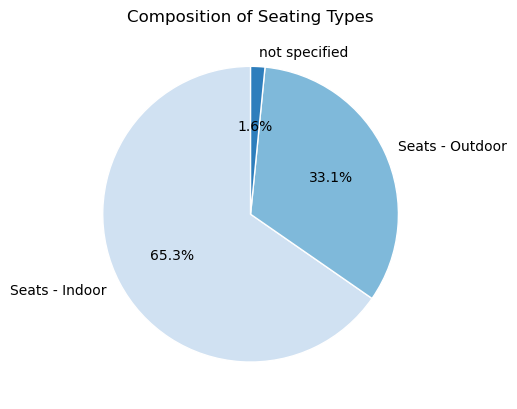

In [451]:

seating_counts = business_df['seating_type'].value_counts()


labels = seating_counts.index
sizes = seating_counts.values
colors = plt.get_cmap('Blues')(np.linspace(0.2, 0.7, len(labels)))

fig, ax = plt.subplots()
ax.pie(sizes, colors=colors, labels=labels, autopct='%1.1f%%', startangle=90,
       wedgeprops={"linewidth": 1, "edgecolor": "white"})

ax.set(aspect='equal') 

plt.title('Composition of Seating Types')
plt.show()

From the Total venus arond 65% are having Indoor Seats



Summed up total seating capacity per location and added Total Number of Seats (Indoor + Outdoor).

In [453]:
#Sum the Total seats (Indoor + Outdoor)
total_seats = business_df.groupby('longitude')['number_of_seats'].sum().reset_index()

# Rename the column 
total_seats.rename(columns={'number_of_seats': 'total_number_of_seats'}, inplace=True)

# Merge the total seats into the original DataFrame
business_df = business_df.drop(columns=['number_of_seats']).merge(total_seats, on='longitude')

print(business_df.head())

business_df.shape

  clue_small_area         trading_name   industry_description  \
0       Docklands               Yassas  Cafes and Restaurants   
1       Docklands     Fukutontei Ramen  Cafes and Restaurants   
2       Docklands               Yassas  Cafes and Restaurants   
3       Docklands  Carl's Jr Docklands  Cafes and Restaurants   
4       Docklands     Fukutontei Ramen  Cafes and Restaurants   

      seating_type   longitude   latitude  total_number_of_seats  
0   Seats - Indoor  144.936589 -37.811859                    484  
1  Seats - Outdoor  144.936589 -37.811859                    484  
2  Seats - Outdoor  144.936589 -37.811859                    484  
3  Seats - Outdoor  144.936589 -37.811859                    484  
4   Seats - Indoor  144.936589 -37.811859                    484  


(3079, 7)

In [455]:
###Drop the Seating Type Column
business_df = business_df.drop(columns=['seating_type'])

In [456]:
###Remove Duplicates
business_df.drop_duplicates(keep='first', inplace=True)
business_df.duplicated().sum()

0

In [457]:
business_df.shape

(2131, 6)

<b>Plotting the Distribution of Seating Capacity
 </b>

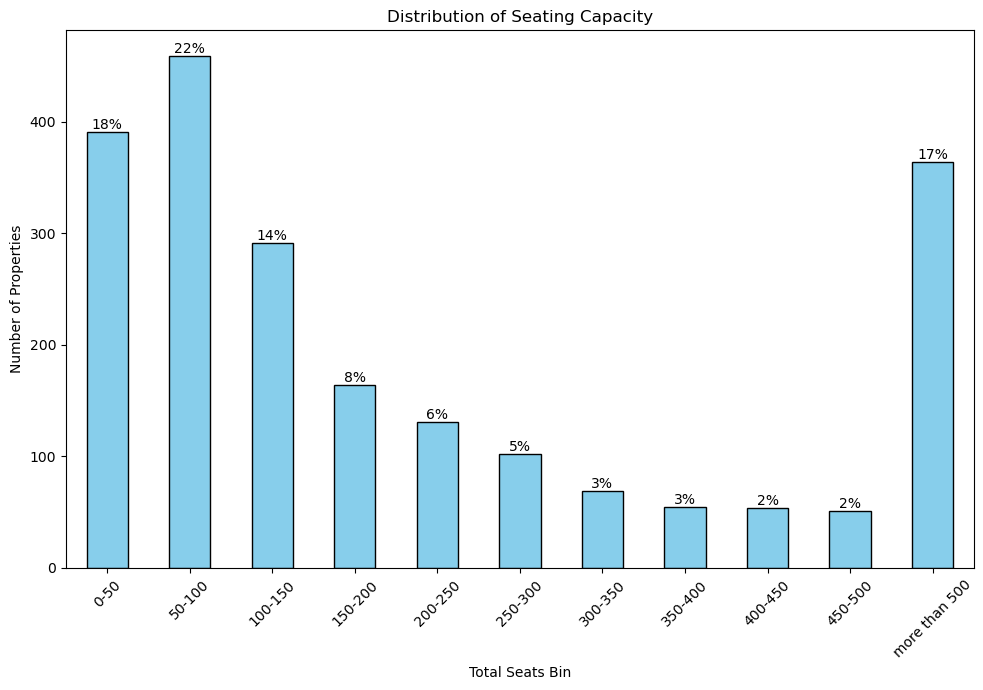

In [458]:
pivot_df = business_df.copy()  
business_df['total_number_of_seats'] = pivot_df['total_number_of_seats']  

# Create bins for total number of seats
bins = list(range(0, 501, 50)) + [float('inf')]
labels = [f'{i}-{i+50}' for i in range(0, 500, 50)] + ['more than 500']
pivot_df['seats_bin'] = pd.cut(pivot_df['total_number_of_seats'], bins=bins, labels=labels, right=False)

bin_counts = pivot_df['seats_bin'].value_counts().sort_index()

# Calculate percentages
total_properties = bin_counts.sum()
percentages = (bin_counts / total_properties * 100).round(1)

plt.figure(figsize=(10, 7))
ax = bin_counts.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Distribution of Seating Capacity')
plt.xlabel('Total Seats Bin')
plt.ylabel('Number of Properties')
plt.xticks(rotation=45)
plt.tight_layout()

for p in ax.patches:
    height = p.get_height()
    bin_label = p.get_x() + p.get_width() / 2
    bin_label_name = ax.get_xticklabels()[int(bin_label)].get_text()
    percentage = percentages[bin_label_name]
    ax.text(p.get_x() + p.get_width() / 2, height, f'{percentage:.0f}%', 
            ha='center', va='bottom', fontsize=10)

plt.show()

More than 40% of the Restaurants and Bars are having less than 100 seating capacity



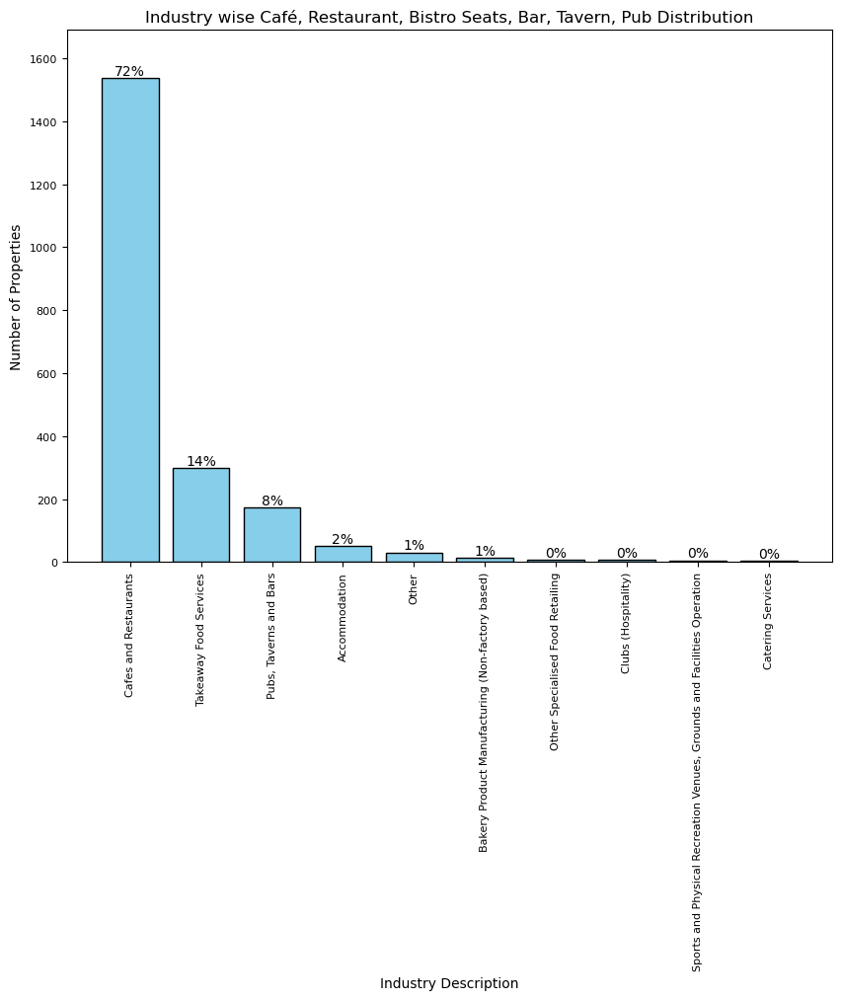

In [459]:
###Plot the Distribution of Industies 

industry_counts = business_df['industry_description'].value_counts()

# Calculate percentages
total_count = industry_counts.sum()
percentages = (industry_counts / total_count) * 100

fig, ax = plt.subplots(figsize=(10, 7))
bar_container = ax.bar(industry_counts.index, industry_counts, color='skyblue',edgecolor='black')


ax.set_xlabel('Industry Description', fontsize=10)
ax.set_ylabel('Number of Properties', fontsize=10)
ax.set_title('Industry wise Café, Restaurant, Bistro Seats, Bar, Tavern, Pub Distribution', fontsize=12)
ax.set_ylim(0, max(industry_counts) + max(industry_counts) * 0.1)  
plt.xticks(rotation=90, fontsize=8)
plt.yticks(fontsize=8)

for p in ax.patches:
    height = p.get_height()
    bin_label = p.get_x() + p.get_width() / 2
    bin_label_name = ax.get_xticklabels()[int(bin_label)].get_text()
    percentage = percentages[bin_label_name]
    ax.text(p.get_x() + p.get_width() / 2, height, f'{percentage:.0f}%', 
            ha='center', va='bottom', fontsize=10)


plt.show()

Cafes and Rrestaurants are the Highest contributing industry from all the industries in the city of Melbourne which is more than 72%.



<b>Displaying Industry wise seating Capacity in a stack bar chart
 </b>

C:\Users\chath\AppData\Local\Temp\ipykernel_18544\919172455.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = pivot_df.groupby(['seats_bin', 'industry_description']).size().unstack(fill_value=0)


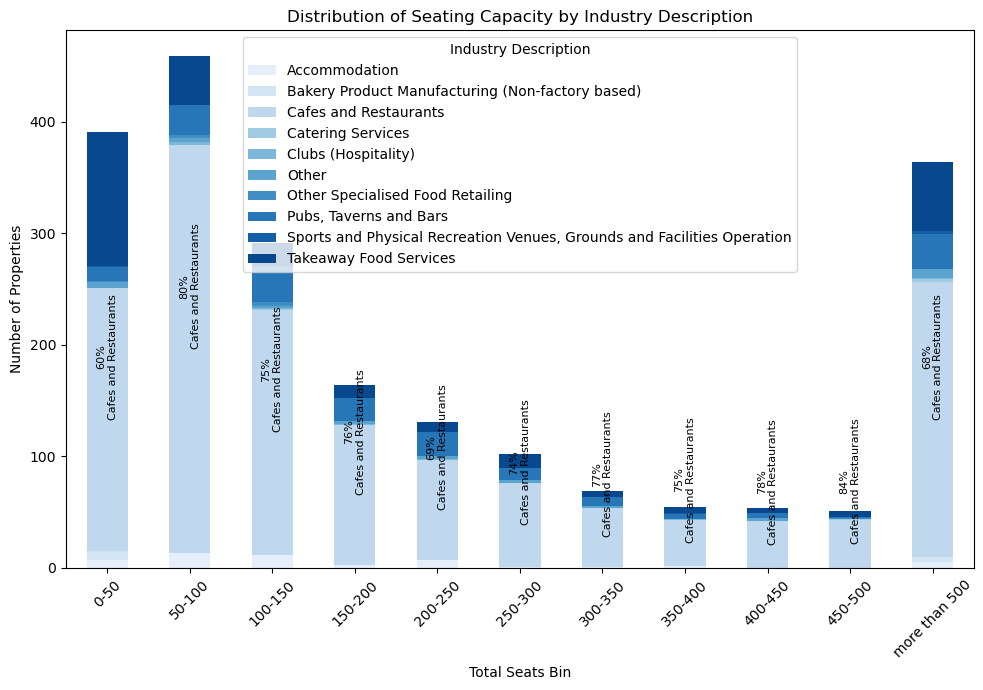

In [460]:

# Group by seats_bin and industry_description, and count the occurrences
grouped = pivot_df.groupby(['seats_bin', 'industry_description']).size().unstack(fill_value=0)

# Calculate the percentage contribution of each industry description within each seats_bin
percentages = grouped.divide(grouped.sum(axis=1), axis=0) * 100


ax = grouped.plot(kind='bar', stacked=True, figsize=(10, 7), color=(sns.color_palette("Blues", n_colors=10)))

for i, bin in enumerate(grouped.index):
    max_contrib_idx = percentages.loc[bin].idxmax()
    max_contrib_val = percentages.loc[bin].max()
    ax.annotate(f'{max_contrib_val:.0f}%\n{max_contrib_idx}', 
                xy=(i, grouped.loc[bin, :].cumsum()[max_contrib_idx] - grouped.loc[bin, max_contrib_idx]/2), 
                ha='center', va='bottom', fontsize=8, color='black', rotation = 90)

plt.title('Distribution of Seating Capacity by Industry Description')
plt.xlabel('Total Seats Bin')
plt.ylabel('Number of Properties')
plt.xticks(rotation=45)
plt.legend(title='Industry Description')
plt.tight_layout()

plt.show()

Cafes and Rrestaurants are the Highest contributing industry for all scale of locations with respect to seating capacity



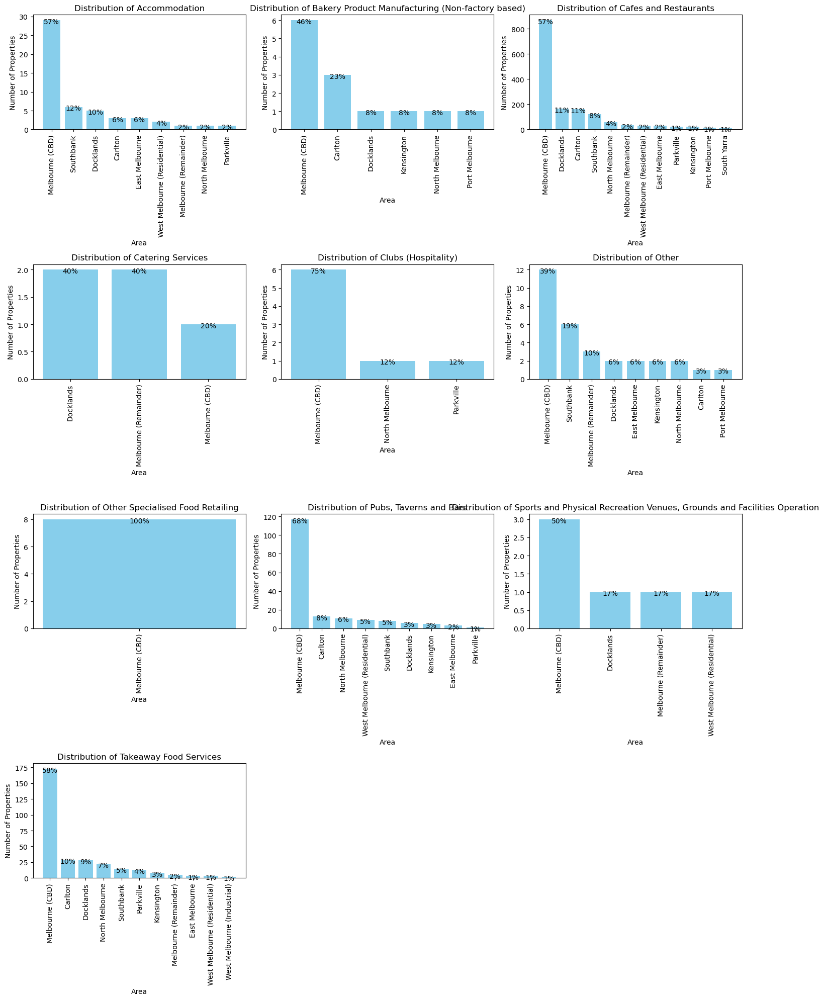

In [461]:
## Area wise Industry Distribution
area_counts = business_df.groupby(['industry_description', 'clue_small_area']).size().reset_index(name='Count')


num_categories = area_counts['industry_description'].nunique()
nrows = (num_categories // 3) + 1
ncols = 3


fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 5 * nrows))
axes = axes.flatten()  

X = area_counts.groupby('industry_description')
num = 0
for category, group in X:
    df = pd.DataFrame(group)
    df = df.sort_values(by='Count', ascending=False)
    
    x_labels = df['clue_small_area'].values
    y_values = df['Count'].values

    ax = axes[num]
    bars = ax.bar(x_labels, y_values, color='skyblue')
    ax.set_title(f'Distribution of {category}')
    ax.set_xlabel('Area')
    ax.set_ylabel('Number of Properties')
    ax.set_xticks(range(len(x_labels)))
    ax.set_xticklabels(x_labels, rotation=90)

    total = y_values.sum()
    for bar, count in zip(bars, y_values):
        height = bar.get_height()
        percentage = f'{(count / total * 100):.0f}%'
        ax.annotate(percentage, xy=(bar.get_x() + bar.get_width() / 2, height), 
                    xytext=(0, 3),  
                    textcoords="offset points", ha='center', va='top')
    num += 1

for i in range(num, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

Other than Catering services all other industries are mainly concentrated around Melbourne (CDB) and most of the Catering services are at the Docklands area.



<b>Displaying the Cafes and Bar locations on map using Folium
 </b>

In [387]:
###Displaying the Cafes and Bar locations on map using Folium

map = folium.Map(location=[cafes_and_bars_df['latitude'].mean(), cafes_and_bars_df['longitude'].mean()], zoom_start=10)

# Add markers for each location
for index, row in cafes_and_bars_df.iterrows():

    folium.Marker([row['latitude'], row['longitude']], popup=row['industry_description'],icon=folium.Icon("blue"),icon_size=(2, 2)).add_to(map)

    
legend_html = """
<div style="position: fixed; 
            bottom: 50px; left: 50px; width: 200px; height:50px; 
            border:2px  grey; font-size:12px;
            background-color:white;">
</div>
"""
    
# Add legend HTML to the map
map.get_root().html.add_child(folium.Element(legend_html))
    
title_html = """
<h3 style="text-align: center; margin: 10px 0;">Café, Restaurant, Bistro Seats, Bar, Tavern, Pub Locations</h3>
"""
map.get_root().html.add_child(folium.Element(title_html))



display(map)

#### Parking Bays.



I performed different data cleaning methods.

1.  Converted lastupdated column as datetime and Filterout past data
2.  Droped roadsegmentid, kerbsideid, lastupdated column.
3.  Renamed roadsegmentdescription column as Location
4.  Added new column as parking type.
5.  Checked for duplicate values and removed those.

In [462]:
parkingbays_df.head()

,roadsegmentid,kerbsideid,roadsegmentdescription,latitude,longitude,lastupdated
0,22730,NaN,Park Street between Mason Street and Randall P...,-37.836245,144.982021,2022-08-31
1,22730,NaN,Park Street between Mason Street and Randall P...,-37.835800,144.982115,2022-08-31
2,20013,5701,Lonsdale Street between William Street and Kin...,-37.814238,144.955451,2023-10-02
3,20013,23444,Lonsdale Street between William Street and Kin...,-37.814271,144.955334,2023-10-02
4,22268,NaN,Clowes Street between Anderson Street and Wals...,-37.830568,144.984713,2022-08-31


In [463]:
parkingbays_df.shape

(19162, 6)

In [464]:
# Convert the 'lastupdated' column to datetime
parkingbays_df['lastupdated'] = pd.to_datetime(parkingbays_df['lastupdated'])

###Filtering Latest Data
parkingbays_df = parkingbays_df[parkingbays_df['lastupdated'].dt.year == 2023 ]

In [465]:
# Drop  columns
parkingbays_df = parkingbays_df.drop(columns=['roadsegmentid','kerbsideid', 'lastupdated'])

# Rename roadsegmentdescription column as location
parkingbays_df = parkingbays_df.rename(columns={'roadsegmentdescription': 'location'})

#Added Parking Type column
parkingbays_df['parking_type'] = 'Parking Bay'

In [466]:
parkingbays_df.nunique()

location         522
latitude        7625
longitude       7616
parking_type       1
dtype: int64

In [467]:
parkingbays_df.drop_duplicates(keep='first', inplace=True)
parkingbays_df.duplicated().sum()

0

#### Parking Meters.

I performed different data cleaning methods.

1.  Droped barcode, creditcard, tapandgo, location, asset_id, meter_id columns.
2.  Rename location_description column as location.
3.  Added new column as parking type column
4.  Checked for duplicate values and removed duplicates

In [468]:
parkingmeters_df.head()

,barcode,creditcard,tapandgo,longitude,latitude,location,asset_id,meter_id,location_description
0,MPM1629529,Yes,Yes,144.953144,-37.781968,"-37.7819682, 144.9531444",1629529,ZOOT8,Royal Park
1,MPM1629539,Yes,Yes,144.950263,-37.787154,"-37.7871538, 144.9502628",1629539,ZOOT23A,Royal Park
2,MPM1629546,Yes,Yes,144.952908,-37.781829,"-37.7818288, 144.9529081",1629546,ZOOT8A,Royal Park
3,MPM1629570,Yes,Yes,144.950592,-37.787432,"-37.7874323, 144.9505921",1629570,ZOOT23,Royal Park
4,MPM1629571,Yes,Yes,144.950776,-37.781745,"-37.7817446, 144.9507757",1629571,ZOOT2,"Royal Park, approximately 73m NW of Leopard Lo..."


In [469]:
parkingmeters_df.shape

(1258, 9)

In [470]:
# Drop  columns
parkingmeters_df = parkingmeters_df.drop(columns=['barcode','creditcard', 'tapandgo','location','asset_id', 'meter_id'])

# Rename Location_description'
parkingmeters_df = parkingmeters_df.rename(columns={'location_description': 'location'})

#Added parking Type column
parkingmeters_df['parking_type'] = 'Parking Meter'

In [471]:
parkingmeters_df.nunique()

longitude       1257
latitude        1257
location        1196
parking_type       1
dtype: int64

In [472]:
###Remove duplicates
parkingmeters_df.drop_duplicates(keep='first', inplace=True)
parkingmeters_df.duplicated().sum()

0

#### Create Total Parking Data Set.


I created a single data fream by merging both parking meters and parking bays data sets. 

1. Checked and handled Null values for merged data set.
2. Checked for the duplicates values and removed duplicates

In [473]:
parking_df = pd.concat([parkingmeters_df, parkingbays_df], ignore_index=True)

In [474]:
parking_df.head()

,longitude,latitude,location,parking_type
0,144.953144,-37.781968,Royal Park,Parking Meter
1,144.950263,-37.787154,Royal Park,Parking Meter
2,144.952908,-37.781829,Royal Park,Parking Meter
3,144.950592,-37.787432,Royal Park,Parking Meter
4,144.950776,-37.781745,"Royal Park, approximately 73m NW of Leopard Lo...",Parking Meter


In [475]:
parking_df.nunique()

longitude       8839
latitude        8863
location        1714
parking_type       2
dtype: int64

In [476]:
##Check Null Values
parking_df.isna().sum() ##No any Null Values

longitude       0
latitude        0
location        0
parking_type    0
dtype: int64

#### Data Visualization- Total Parking Data Set.



<b>Plotting Pie chart to visualise the composition of parking Types </b>

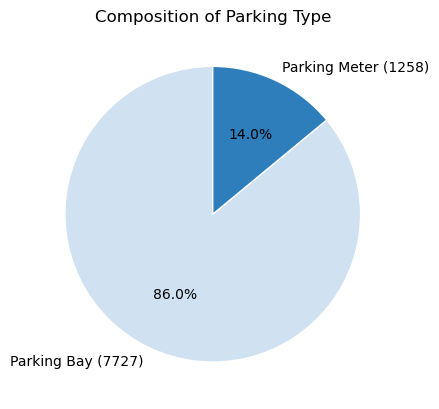

In [477]:

parking_counts = parking_df['parking_type'].value_counts()


labels = [f'{label} ({count})' for label, count in zip(parking_counts.index, parking_counts.values)]
sizes = parking_counts.values
colors = plt.get_cmap('Blues')(np.linspace(0.2, 0.7, len(labels)))

fig, ax = plt.subplots()
ax.pie(sizes, colors=colors, labels=labels, autopct='%1.1f%%', startangle=90,
       wedgeprops={"linewidth": 1, "edgecolor": "white"})

ax.set(aspect='equal') 

plt.title('Composition of Parking Type')
plt.show()

<b>Displaying Parking Bays and Meters locations on map using Folium </b>

In [591]:

map = folium.Map(location=[parking_df['latitude'].mean(), parking_df['longitude'].mean()], zoom_start=10)

# Add markers for each location
for index, row in parking_df.iterrows():

    folium.Marker([row['latitude'], row['longitude']], popup=row['location'],icon=folium.Icon("blue"),icon_size=(2, 2)).add_to(map)

    
legend_html = """
<div style="position: fixed; 
            bottom: 50px; left: 50px; width: 200px; height:50px; 
            border:2px  grey; font-size:12px;
            background-color:white;">
</div>
"""
    
# Add legend HTML to the map
map.get_root().html.add_child(folium.Element(legend_html))
    
title_html = """
<h3 style="text-align: center; margin: 10px 0;">Parking Locations</h3>
"""
map.get_root().html.add_child(folium.Element(title_html))



display(map)

#### Parking Accessibility Score Calculation


<b>Creating GeoDataFrames to store geographic data for businesses and parking spots   </b>

1. Defined a function to calculate the nearest parking location for each business and to determines how many parking locations are within certain  distances (100 meters and 200 meters)
2. Used GeoDataFrames to store geographic data (latitude, longitude) for businesses and parking spots.
3. Added nearest_parking_distance , nearest_parking_name, Number of parking_within_100_meters, parking_within_200_meters to New GeoDataFrame

In [485]:
# Function to calculate the nearest parking location and distance
def find_nearest_parking_with_details(business_gdf, parking_gdf):
    nearest_parking_distances = []
    nearest_parking_names = []
    nearby_parking_counts_100 = []
    nearby_parking_counts_200 = []

    # Iterate over each vanue
    for idx, venue in business_gdf.iterrows():
        venue_coords = (venue.geometry.y, venue.geometry.x)  # (latitude, longitude)

        # Calculate distance between the venue and each parking location
        parking_gdf['distance'] = parking_gdf.geometry.apply(lambda parking_geom: 
            great_circle((parking_geom.y, parking_geom.x), venue_coords).meters)
        
        # Get the nearest parking location
        nearest_parking = parking_gdf.nsmallest(1, 'distance').iloc[0]  # Nearest parking location
        
        # Append nearest parking details to the lists
        nearest_parking_distances.append(nearest_parking['distance'])
        nearest_parking_names.append(nearest_parking['location'])  
        
        # Count the number of parking locations within 100 meters and 200 meters
        count_100 = parking_gdf[parking_gdf['distance'] <= 100].shape[0]
        count_200 = parking_gdf[parking_gdf['distance'] <= 200].shape[0]
        
        nearby_parking_counts_100.append(count_100)
        nearby_parking_counts_200.append(count_200)

    # Add the nearest parking details and counts to cafes_gdf
    business_gdf['nearest_parking_distance'] = nearest_parking_distances
    business_gdf['nearest_parking_name'] = nearest_parking_names
    business_gdf['parking_within_100_meters'] = nearby_parking_counts_100
    business_gdf['parking_within_200_meters'] = nearby_parking_counts_200

    return business_gdf

# Create sample GeoDataFrames
def create_geodataframes(business_df, parking_df):
    business_gdf = gpd.GeoDataFrame(business_df, geometry=gpd.points_from_xy(business_df.longitude, business_df.latitude))
    parking_gdf = gpd.GeoDataFrame(parking_df, geometry=gpd.points_from_xy(parking_df.longitude, parking_df.latitude))
    return business_gdf, parking_gdf

# Create GeoDataFrames
business_gdf, parking_gdf = create_geodataframes(business_df, parking_df)

# Apply the function to calculate nearest parking details and counts
business_gdf = find_nearest_parking_with_details(business_gdf, parking_gdf)

# Display the updated DataFrame
print(business_gdf.head(10))


    clue_small_area                               trading_name  \
0         Docklands                                     Yassas   
1         Docklands                           Fukutontei Ramen   
3         Docklands                        Carl's Jr Docklands   
5         Docklands                         8 Street Docklands   
7         Docklands                        The Pancake Parlour   
8         Docklands  Them Authentic Vietnamese Cuisine & Rolls   
9         Docklands                               Hanoi Square   
10        Docklands                                    Bababoi   
14        Docklands                                      Perso   
16  North Melbourne                        Melbourne Kebab Box   

      industry_description   longitude   latitude  total_number_of_seats  \
0    Cafes and Restaurants  144.936589 -37.811859                    484   
1    Cafes and Restaurants  144.936589 -37.811859                    484   
3    Cafes and Restaurants  144.936589 -37.81

<b>Plotting histograms to visualise the distribution and skewness of numerical variables </b>

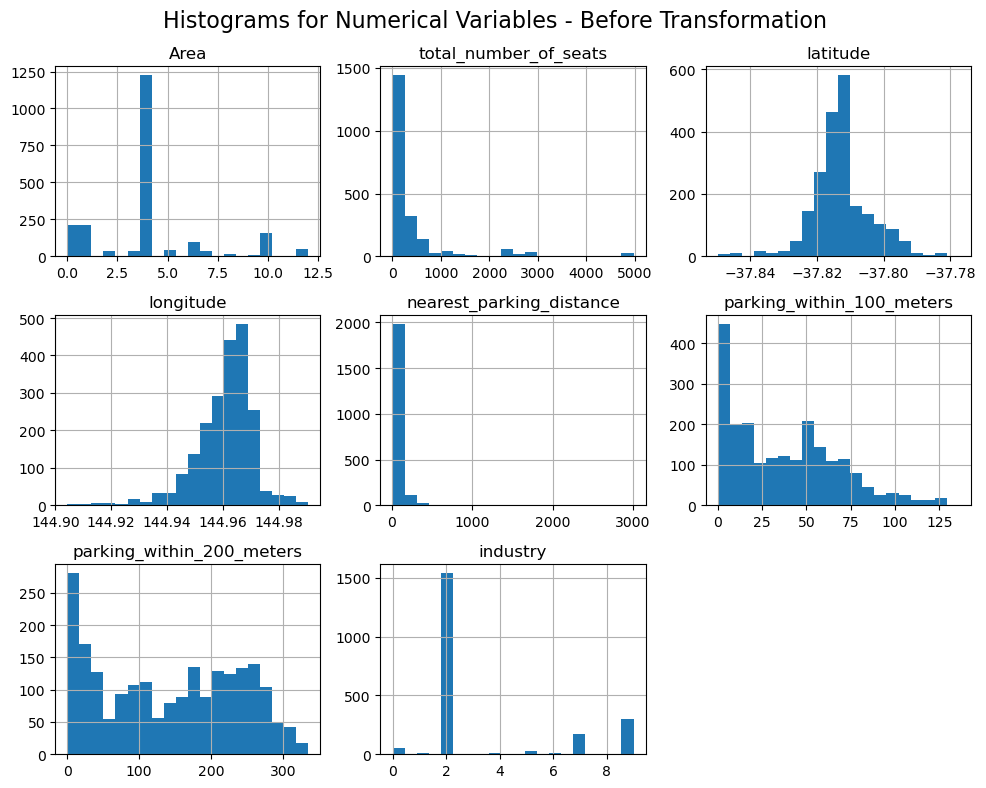

In [486]:
business_gdf[['Area','total_number_of_seats', 'latitude', 'longitude', 'nearest_parking_distance', 'parking_within_100_meters', 'parking_within_200_meters', 'industry' ]].hist(figsize=(10, 8), bins=20)
plt.suptitle('Histograms for Numerical Variables - Before Transformation', fontsize=16)
plt.tight_layout()
plt.show()

<b>Calculating Skewnewss of Variables -Before Transformation</b>

In [488]:
cols=['Area','total_number_of_seats', 'latitude', 'longitude', 'nearest_parking_distance', 'parking_within_100_meters', 'parking_within_200_meters', 'industry' ]
skewness=business_gdf[cols].skew()

# Print the skewness of each variable
print("Skewness of Variables:")
print(skewness)

Skewness of Variables:
Area                          0.927273
total_number_of_seats         3.687359
latitude                     -0.002455
longitude                    -1.207863
nearest_parking_distance     10.595545
parking_within_100_meters     0.613441
parking_within_200_meters     0.007805
industry                      1.285163
dtype: float64


The 'Area','total_number_of_seats', 'nearest_parking_distance' and 'industry' columns are skewed

<b> Handling skewness by applying Yeo-Johnson Transformation</b>

In [489]:

cafes_gdf_copy = business_gdf.copy()

# Features to apply Yeo-Johnson transformation (correcting skewness)
features = ['Area','total_number_of_seats', 'nearest_parking_distance', 'industry']

# Initialize Yeo-Johnson transformer
pt = PowerTransformer(method='yeo-johnson')

# Apply transformation and replace original columns with transformed columns
cafes_gdf_copy[features] = pt.fit_transform(cafes_gdf_copy[features])



<b>Calculating Skewnewss of Variables -After Transformation</b>

In [490]:
cols=['Area','total_number_of_seats', 'latitude', 'longitude', 'nearest_parking_distance', 'parking_within_100_meters', 'parking_within_200_meters', 'industry' ]
skewness=cafes_gdf_copy[cols].skew()

# Print the skewness of each variable
print("Skewness of Variables:")
print(skewness)

Skewness of Variables:
Area                         0.004329
total_number_of_seats        0.001013
latitude                    -0.002455
longitude                   -1.207863
nearest_parking_distance     0.030340
parking_within_100_meters    0.613441
parking_within_200_meters    0.007805
industry                    -0.075064
dtype: float64


The skewness of the variables corrected by Yeo-Johnson transformer

<b> Normalizing the Data set by MinMax Scalling</b>

In [491]:
# Features to apply Scalling
features = ['Area','total_number_of_seats', 'latitude', 'longitude', 'nearest_parking_distance', 'parking_within_100_meters', 'parking_within_200_meters', 'industry']

# Initialize MinMaxScaler
scaler = MinMaxScaler()

# Apply MinMax scaling
cafes_gdf_copy[features] = scaler.fit_transform(cafes_gdf_copy[features])



<b>Plotting histograms to visualise the distribution and skewness of numerical variables after Transformation </b>

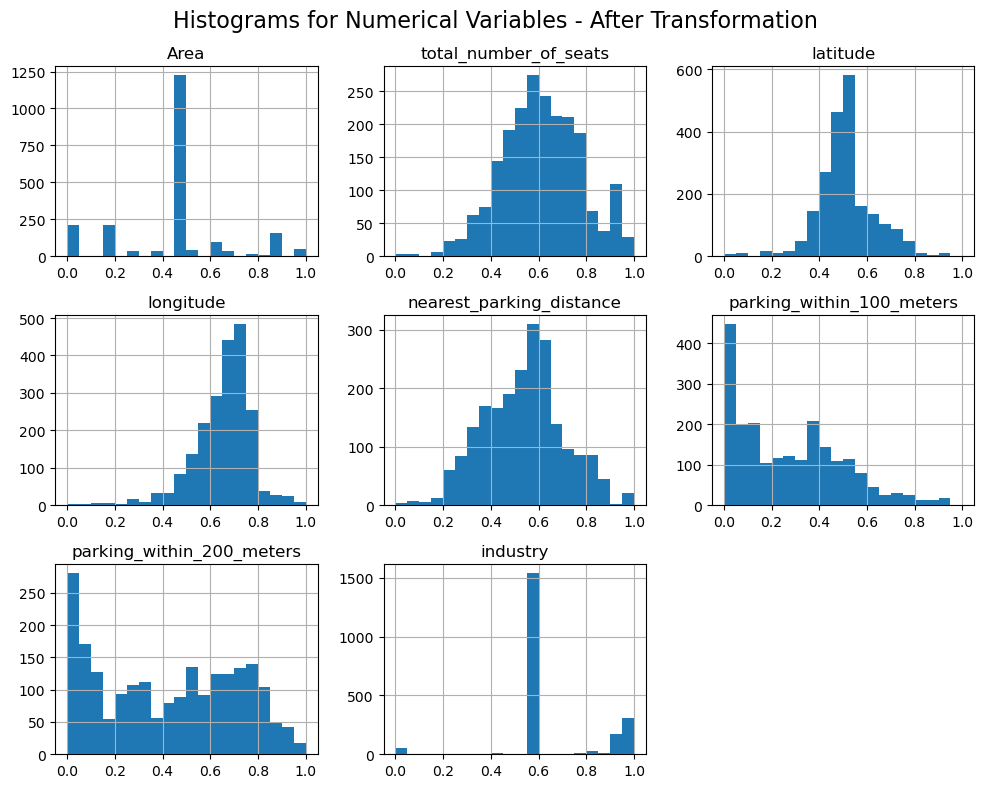

In [493]:
cafes_gdf_copy[['Area','total_number_of_seats', 'latitude', 'longitude', 'nearest_parking_distance', 'parking_within_100_meters', 'parking_within_200_meters', 'industry' ]].hist(figsize=(10, 8), bins=20)
plt.suptitle('Histograms for Numerical Variables - After Transformation', fontsize=16)
plt.tight_layout()
plt.show()

<b>Calculating the Parking Accessibility Score </b>

I calculated Parking Accessibility Score for each venue based on several factors, including the Industry , distance to the nearest parking spot, the number of parking spots within 100 and 200 meters, and the total number of seats available at the venue. The score is a weighted combination of these factors. 

Industry Scaling Factor:
industry_weights is used to assign a different scaling factor to each industry. For example, cafes/restaurants and accommodation get a full weight (1.0), while takeaway services get a reduced weight (0.6) due to likely lower parking needs. 

<br>Parking Accessibility Score Formula
 <br>Parking Accessibility Score = industry_weight (w1×(1 − nearest_parking_distance) + w2×parking_within_100_meters + w3×parking_within_200_meters + w4×total_number_of_seats)

In [496]:
# Define a mapping for industry weights based on the contribution %
industry_weights = {
    'Cafes and Restaurants': 1.0,
    'Takeaway Food Services': 0.6,
    'Pubs, Taverns and Bars': 0.8,
    'Accommodation': 1.0,
    'Bakery Product Manufacturing (Non-factory based)': 0.6,
    'Other Specialised Food Retailing': 0.4,
    'Catering Services': 0.3,
    'Clubs (Hospitality)': 0.5,
    'Sports and Physical Recreation Venues, Grounds and Facilities Operation': 0.8,
    'Other': 0.2
}

# Apply the industry weights to the DataFrame
cafes_gdf_copy['industry_weight'] = cafes_gdf_copy['industry_description'].map(industry_weights)

# Define weights for other factors
w1 = 0.3  # Weight for nearest parking distance
w2 = 0.2  # Weight for parking within 100 meters
w3 = 0.2  # Weight for parking within 200 meters
w4 = 0.3  # Weight for total number of seats

# Calculate the Parking Accessibility Score including industry weight
cafes_gdf_copy['parking_accessibility_score'] = (
    cafes_gdf_copy['industry_weight'] * (
        w1 * (1 - cafes_gdf_copy['nearest_parking_distance']) +  # Inverse for distance (closer is better)
        w2 * cafes_gdf_copy['parking_within_100_meters'] +
        w3 * cafes_gdf_copy['parking_within_200_meters'] +
        w4 * cafes_gdf_copy['total_number_of_seats']
    )
)

# Display the updated DataFrame with the Parking Accessibility Score
print(cafes_gdf_copy.head(10))


    clue_small_area                               trading_name  \
0         Docklands                                     Yassas   
1         Docklands                           Fukutontei Ramen   
3         Docklands                        Carl's Jr Docklands   
5         Docklands                         8 Street Docklands   
7         Docklands                        The Pancake Parlour   
8         Docklands  Them Authentic Vietnamese Cuisine & Rolls   
9         Docklands                               Hanoi Square   
10        Docklands                                    Bababoi   
14        Docklands                                      Perso   
16  North Melbourne                        Melbourne Kebab Box   

      industry_description  longitude  latitude  total_number_of_seats  \
0    Cafes and Restaurants   0.374842  0.524192               0.763838   
1    Cafes and Restaurants   0.374842  0.524192               0.763838   
3    Cafes and Restaurants   0.374842  0.524192    

<b>Plotting histogram to visualise the distribution and skewness of Parking Accessibility Score  </b>

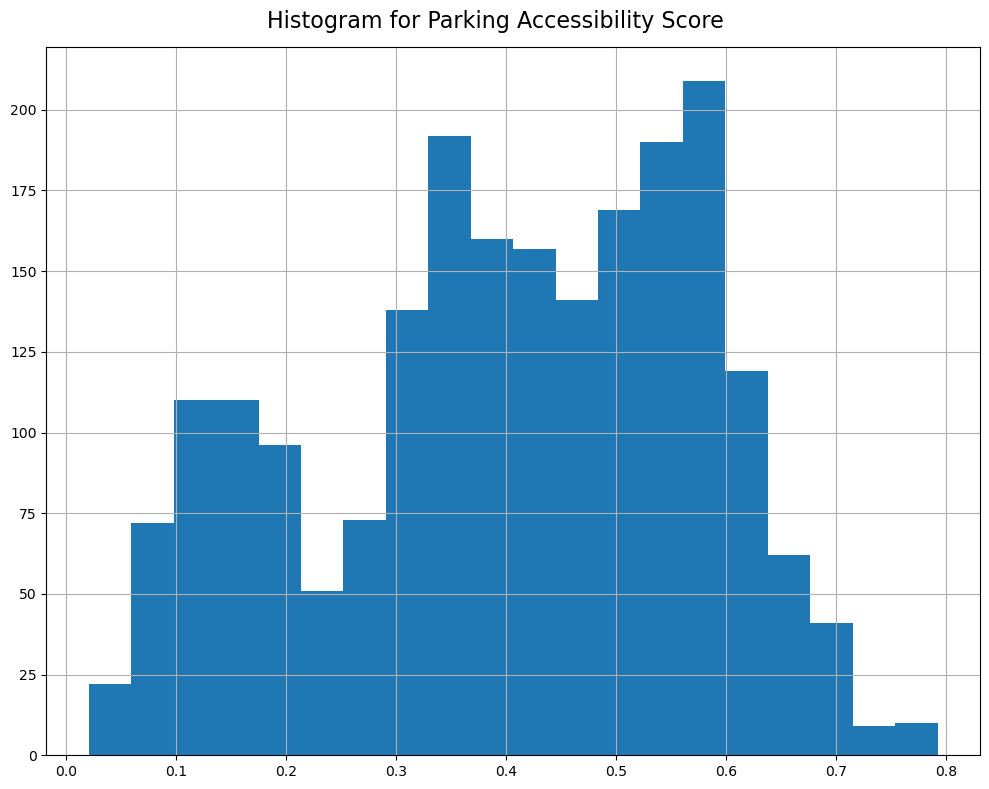

In [500]:
cafes_gdf_copy['parking_accessibility_score' ].hist(figsize=(10, 8), bins=20)
plt.suptitle('Histogram for Parking Accessibility Score', fontsize=16)
plt.tight_layout()
plt.show()


The Accessibility score looks like normally distributed within 0 and 1 

<b> Define and apply categories based on Parking Accessibility Score  </b>

The function categorize_accessibility is used to assign a catogery to each business based on the calculated parking accessibility score

In [501]:
# Define categories based on Parking Accessibility Score
def categorize_accessibility(score):
    if score >= 0.6:
        return 'High Accessibility'
    elif score >= 0.4:
        return 'Moderate Accessibility'
    else:
        return 'Low Accessibility'

# Apply categorization
cafes_gdf_copy['accessibility_category'] = Cafes_Transformed['parking_accessibility_score'].apply(categorize_accessibility)

# Display the DataFrame with the new category column
print(cafes_gdf_copy.head(10))

    clue_small_area                               trading_name  \
0         Docklands                                     Yassas   
1         Docklands                           Fukutontei Ramen   
3         Docklands                        Carl's Jr Docklands   
5         Docklands                         8 Street Docklands   
7         Docklands                        The Pancake Parlour   
8         Docklands  Them Authentic Vietnamese Cuisine & Rolls   
9         Docklands                               Hanoi Square   
10        Docklands                                    Bababoi   
14        Docklands                                      Perso   
16  North Melbourne                        Melbourne Kebab Box   

      industry_description  longitude  latitude  total_number_of_seats  \
0    Cafes and Restaurants   0.374842  0.524192               0.763838   
1    Cafes and Restaurants   0.374842  0.524192               0.763838   
3    Cafes and Restaurants   0.374842  0.524192    

<b> Pie chart to get the composition of categories based on Parking Accessibility Score Catogery </b>

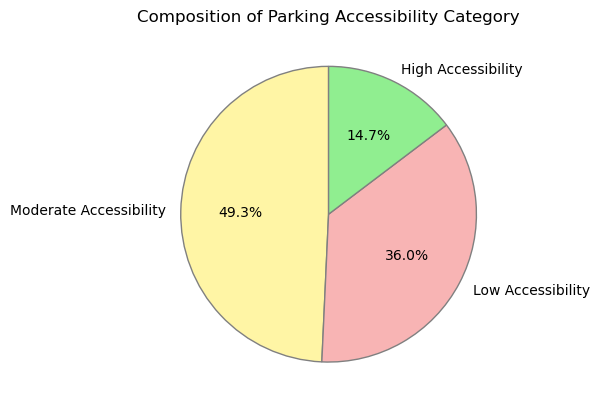

In [521]:
# Get counts of each category
seating_counts = cafes_gdf_copy['accessibility_category'].value_counts()

# Define labels and sizes for the pie chart
labels = seating_counts.index
sizes = seating_counts.values

# Define specific colors for each category
color_map = {
    'High Accessibility': '#90EE90',  # Light green
    'Moderate Accessibility': '#FFF5A5',  # Light yellow
    'Low Accessibility': '#F8B4B4'  # Light red
}

# Apply the colors based on the labels
colors = [color_map[label] for label in labels]

# Create the pie chart
fig, ax = plt.subplots()
wedges, texts, autotexts = ax.pie(sizes, colors=colors, labels=labels, autopct='%1.1f%%', startangle=90,
       wedgeprops={"linewidth": 1, "edgecolor": "grey"})  # Add outline here

# Set the aspect ratio to 'equal' to ensure the pie chart is a circle
ax.set(aspect='equal')

# Add title to the chart
plt.title('Composition of Parking Accessibility Category')

# Display the pie chart
plt.show()


Around 50% of the Business locations are having moderate accessibility 

<b> Multiple bar charts to identify the distribution of Industries based on Parking Accessibility Score Catogery </b>

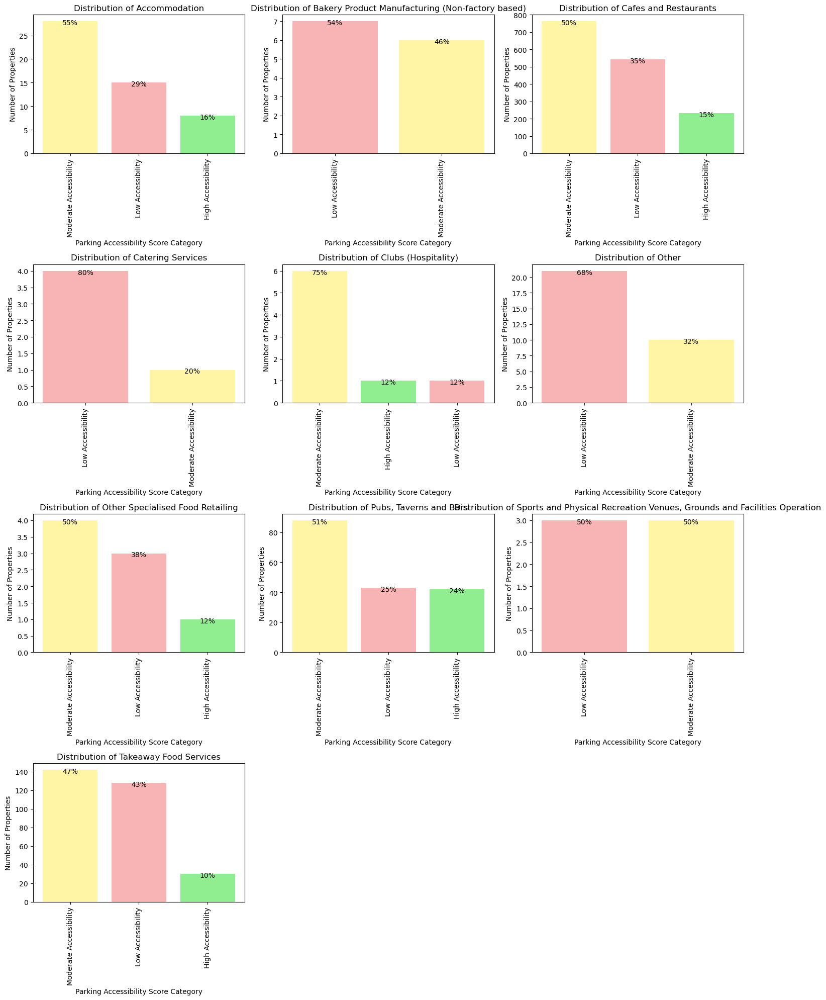

In [523]:
# Create color mapping for bars
def get_color(category):
    return color_map.get(category, 'skyblue')  # Default color if not found in color_map

# Group by industry and accessibility category, and count the occurrences
area_counts = cafes_gdf_copy.groupby(['industry_description', 'accessibility_category']).size().reset_index(name='Count')

# Determine number of rows and columns for subplots
num_categories = area_counts['industry_description'].nunique()
nrows = (num_categories // 3) + 1
ncols = 3

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 5 * nrows))
axes = axes.flatten()  

X = area_counts.groupby('industry_description')
num = 0
for category, group in X:
    df = pd.DataFrame(group)
    df = df.sort_values(by='Count', ascending=False)
    
    x_labels = df['accessibility_category'].values
    y_values = df['Count'].values

    ax = axes[num]
    bars = ax.bar(x_labels, y_values, color=[get_color(cat) for cat in x_labels])
    ax.set_title(f'Distribution of {category}')
    ax.set_xlabel('Parking Accessibility Score Category')
    ax.set_ylabel('Number of Properties')
    ax.set_xticks(range(len(x_labels)))
    ax.set_xticklabels(x_labels, rotation=90)

    total = y_values.sum()
    for bar, count in zip(bars, y_values):
        height = bar.get_height()
        percentage = f'{(count / total * 100):.0f}%'
        ax.annotate(percentage, xy=(bar.get_x() + bar.get_width() / 2, height), 
                    xytext=(0, 3),  
                    textcoords="offset points", ha='center', va='top')
    num += 1

for i in range(num, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()


Bakery , Catering and other industries are having higher low accessibility compared to other industries which are having higher contribution of moderate accessibility  

<b> Stack bar chart to identify the distribution of Areas based on Parking Accessibility Score Catogery </b>

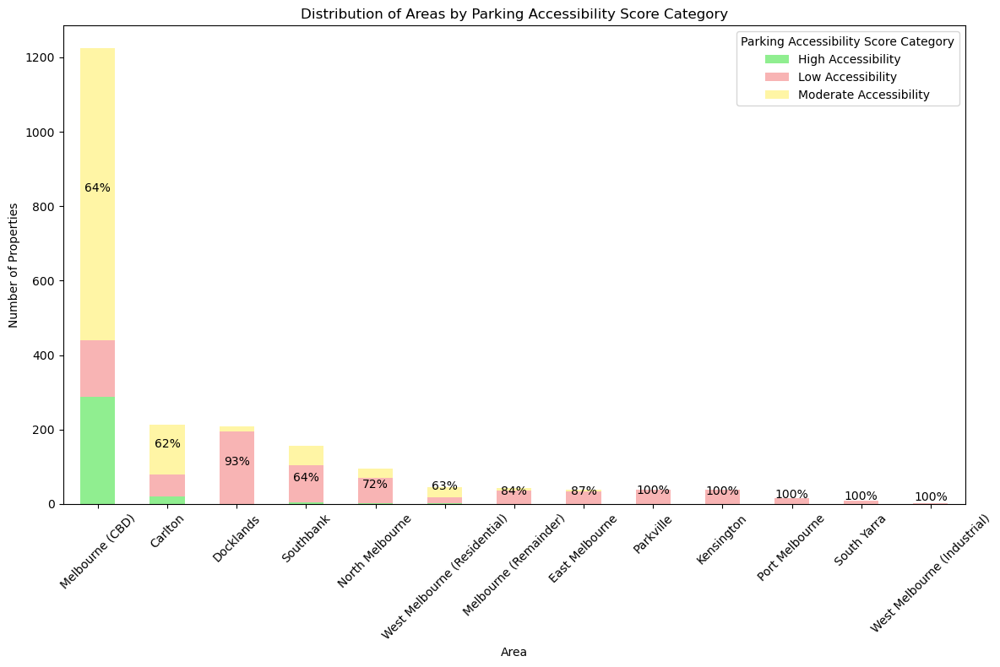

In [522]:
# Group by accessibility_category and count the occurrences
grouped = cafes_gdf_copy.groupby(['clue_small_area', 'accessibility_category']).size().unstack(fill_value=0)

# Calculate the total counts per area
grouped['total'] = grouped.sum(axis=1)

# Sort by the total counts in descending order
sorted_grouped = grouped.sort_values(by='total', ascending=False).drop(columns='total')

# Calculate the percentage contribution of each accessibility category within each area
percentages = sorted_grouped.divide(sorted_grouped.sum(axis=1), axis=0) * 100

# Plot the data
fig, ax = plt.subplots(figsize=(12, 8))

# Create the stacked bar plot with specified colors
sorted_grouped.plot(kind='bar', stacked=True, ax=ax, color=[color_map[cat] for cat in sorted_grouped.columns])

# Annotate only the highest percentage value on each bar
for i, area in enumerate(sorted_grouped.index):
    # Get the highest percentage value and its corresponding category
    max_contrib_idx = percentages.loc[area].idxmax()
    max_contrib_val = percentages.loc[area].max()
    
    # Annotate only the highest percentage
    ax.annotate(f'{max_contrib_val:.0f}%', 
                xy=(i, sorted_grouped.loc[area, :].cumsum()[max_contrib_idx] - sorted_grouped.loc[area, max_contrib_idx]/2), 
                ha='center', va='bottom', fontsize=10, color='black')


plt.title('Distribution of Areas by Parking Accessibility Score Category')
plt.xlabel('Area')
plt.ylabel('Number of Properties')
plt.xticks(rotation=45)
plt.legend(title='Parking Accessibility Score Category')
plt.tight_layout()

# Show the plot
plt.show()


Areas like Docklands, Southbank, North Melbourn are hiving high low accessibility venues while Melbourne(CDB) , Carlton are having high moderate accessibility venues.

<b> Plotting Correlation Heatmap for Numeric Variables </b>

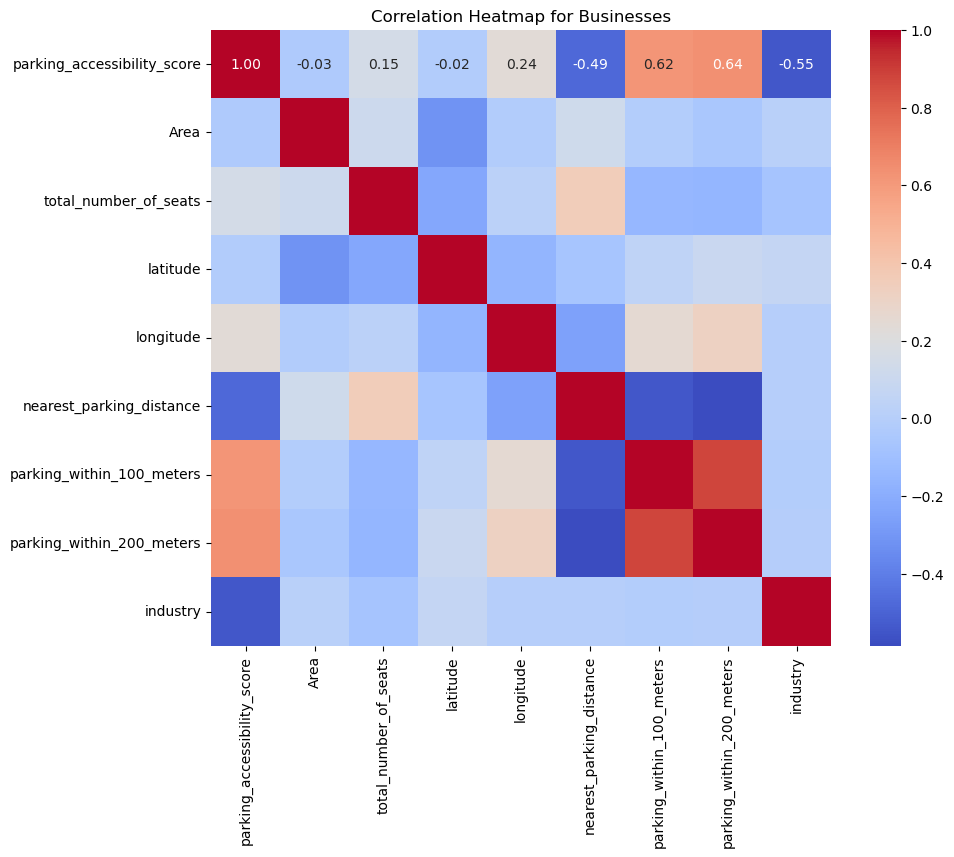

In [524]:
#correlation heatmap using numeric columns
corr_matrix = cafes_gdf_copy[['parking_accessibility_score','Area','total_number_of_seats', 'latitude', 'longitude', 'nearest_parking_distance', 'parking_within_100_meters', 'parking_within_200_meters', 'industry']].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap for Businesses')
plt.show()

Parking Accessibility Score and Parking within 100 and 200 Meters having positive correlation suggests that better parking accessibility is associated with more parking spaces within 100 and 200 meters.

#### Model Selection and Model Building.



<b> Implementing Clustering Models </b>

<b> 1. DBSCAN Clustering Model </b>

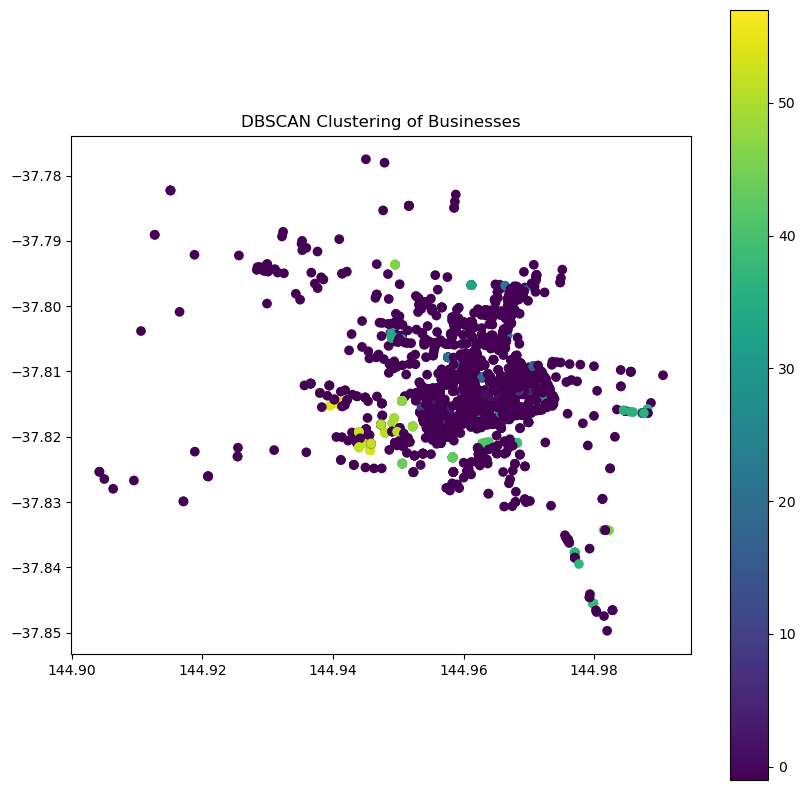

Number of clusters: 58
Number of noise points: 1600
Silhouette Score: 0.8552578053403549


In [547]:
# Convert coordinates to numpy array
coords = np.array(cafes_gdf_copy[['Area', 'total_number_of_seats', 'latitude', 'longitude', 
                                  'nearest_parking_distance', 'parking_within_100_meters', 
                                  'parking_within_200_meters', 'industry']])

# DBSCAN clustering 
dbscan = DBSCAN(eps=0.07, min_samples=5)  
cafes_gdf_copy['dbscan_cluster'] = dbscan.fit_predict(coords)

# Update cafes_gdf with clustering results
cafes_gdf = cafes_gdf_copy.copy()

# Plot clusters
fig, ax = plt.subplots(figsize=(10, 10))
cafes_gdf.plot(column='dbscan_cluster', ax=ax, legend=True, cmap='viridis')
plt.title('DBSCAN Clustering of Businesses')
plt.show()

# Number of clusters and noise
num_clusters = len(set(cafes_gdf['dbscan_cluster'])) - (1 if -1 in cafes_gdf['dbscan_cluster'].values else 0)
num_noise = (cafes_gdf['dbscan_cluster'] == -1).sum()
print(f"Number of clusters: {num_clusters}")
print(f"Number of noise points: {num_noise}")

# Filter out noise points for silhouette score
filtered_coords = coords[cafes_gdf['dbscan_cluster'] != -1]
filtered_labels = cafes_gdf['dbscan_cluster'][cafes_gdf['dbscan_cluster'] != -1]

if len(set(filtered_labels)) > 1:
    score = silhouette_score(filtered_coords, filtered_labels)
    print(f"Silhouette Score: {score}")
else:
    print("Silhouette Score cannot be computed, insufficient number of clusters.")


<b>Silhouette Score</b> of <b>DBSCAN  0.855 </b>-a rather high score, indicating that the clustering is not only  well-separated but that the clusters are meaningful. 
Further DBSCAN identified 58 clusters,indicates there are a lot of distinctly different groups of businesses regarding parking density. However high noise points around 1600, showing for some locations where parking density is too low to form meaningful clusters

<b> 2. KMeans Clustering Model </b>

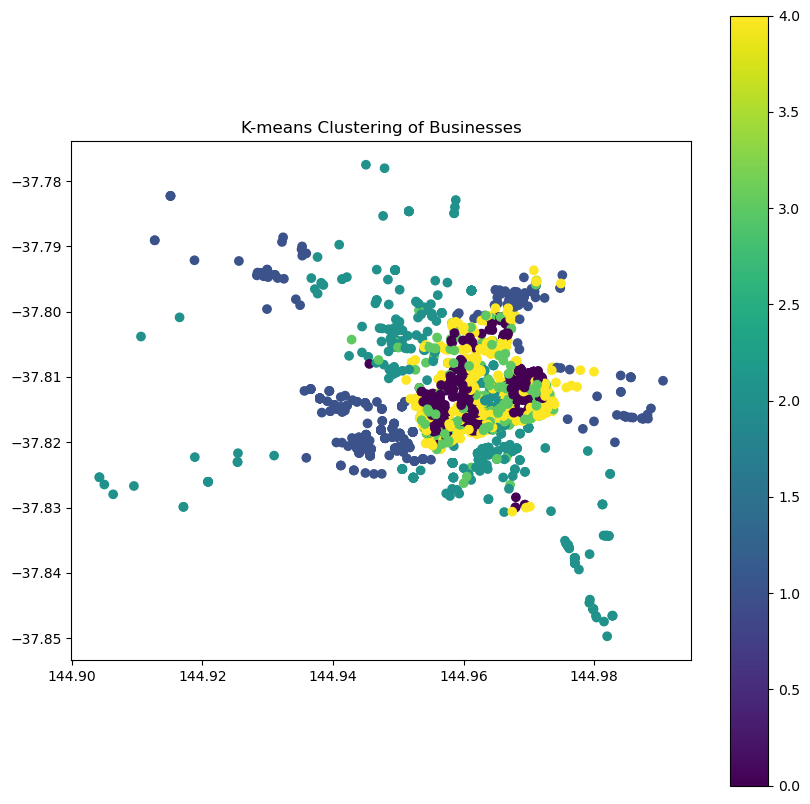

Silhouette Score: 0.20361282054487595
Inertia: 312.44472181307367
Number of points in each cluster:
kmeans_cluster
4    523
0    514
2    448
1    346
3    300
Name: count, dtype: int64


In [545]:

# Convert coordinates to numpy array
coords = np.array(cafes_gdf_copy[['Area', 'total_number_of_seats', 'latitude', 'longitude', 
                                  'nearest_parking_distance', 'parking_within_100_meters', 
                                  'parking_within_200_meters', 'industry']])

# Number of clusters
n_clusters = 5

# K-means clustering
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
cafes_gdf_copy['kmeans_cluster'] = kmeans.fit_predict(coords)

# Update cafes_gdf with clustering results
cafes_gdf = cafes_gdf_copy.copy()

# Plot clusters
fig, ax = plt.subplots(figsize=(10, 10))
cafes_gdf.plot(column='kmeans_cluster', ax=ax, legend=True, cmap='viridis')
plt.title('K-means Clustering of Businesses')
plt.show()

# Evaluation metrics
# Silhouette Score
score = silhouette_score(coords, cafes_gdf['kmeans_cluster'])
print(f"Silhouette Score: {score}")

# Inertia
inertia = kmeans.inertia_
print(f"Inertia: {inertia}")

# Number of points in each cluster
cluster_counts = cafes_gdf['kmeans_cluster'].value_counts()
print("Number of points in each cluster:")
print(cluster_counts)


A Silhouette Score for K-means clustring of 0.204 is relatively low, suggesting that the clusters are not as well-separated

Combining insights from both DBSCAN and K-means can provide a better understanding of parking sufficiency. DBSCAN's detailed clustering can highlight specific problem areas, while K-means provides a broader classification. Based on the clustering results, specific interventions can be planned to improve parking sufficiency around businesses. This might involve adding more parking spaces, adjusting parking regulations, or improving parking infrastructure.

<b> Implementing Regression Models </b>

<b>1. Linear Regression Model</b>

In [553]:
# Features and target variable
X = cafes_gdf_copy[['total_number_of_seats', 'nearest_parking_distance', 'parking_within_100_meters', 'parking_within_200_meters', 'industry']]
y = cafes_gdf_copy['parking_accessibility_score']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit model
model = LinearRegression()
model.fit(X_train, y_train)

# Predict
y_pred = model.predict(X_test)

# Evaluate
print(f'MSE: {mean_squared_error(y_test, y_pred)}')
print(f'R-squared: {r2_score(y_test, y_pred)}')




MSE: 0.00582099541190117
R-squared: 0.8030568346912619


<b>2. Logistic Regression Model</b>

Accuracy: 0.9578454332552693
Precision: 0.9225806451612903
Recall: 0.959731543624161
F1-score: 0.9407894736842105


<Figure size 1000x700 with 0 Axes>

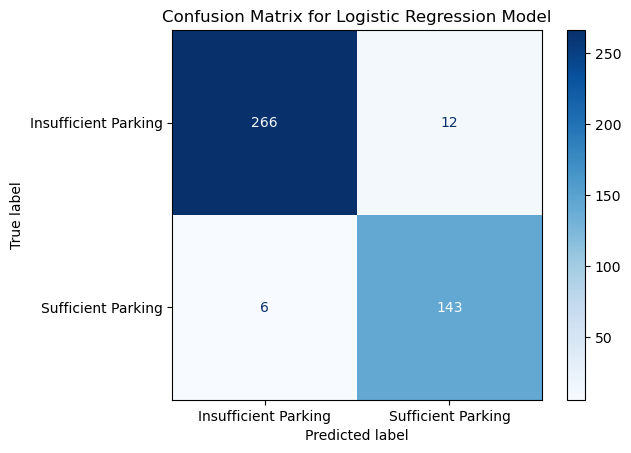

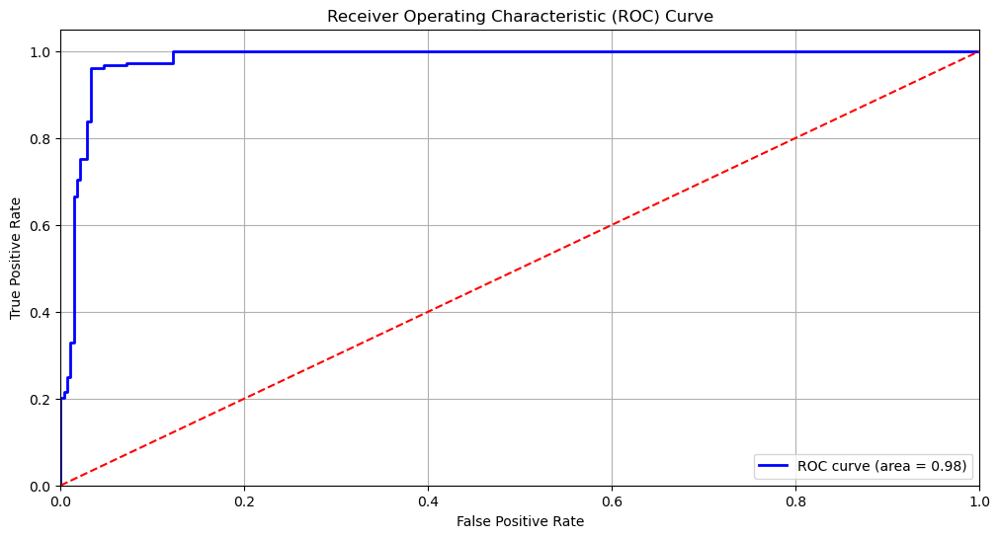

In [560]:
# Convert accessibility score to binary classification
threshold = 0.5  
cafes_gdf_copy['accessibility_binary'] = (cafes_gdf_copy['parking_accessibility_score'] > threshold).astype(int)
y = cafes_gdf_copy['accessibility_binary']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and fit the model
model = LogisticRegression()
model.fit(X_train, y_train)

# Predict
y_pred = model.predict(X_test)

# Evaluate
print(f'Accuracy: {accuracy_score(y_test, y_pred)}')
print(f'Precision: {precision_score(y_test, y_pred)}')
print(f'Recall: {recall_score(y_test, y_pred)}')
print(f'F1-score: {f1_score(y_test, y_pred)}')

# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Insufficient Parking', 'Sufficient Parking'])

plt.figure(figsize=(10, 7))
disp.plot(cmap='Blues')
plt.title('Confusion Matrix for Logistic Regression Model')
plt.show()

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, model.predict_proba(X_test)[:, 1])
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(12, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()


<b>3. Random Forest Regressor Model</b>

MSE: 0.01883138173302108
R-squared: 0.9171090966153252


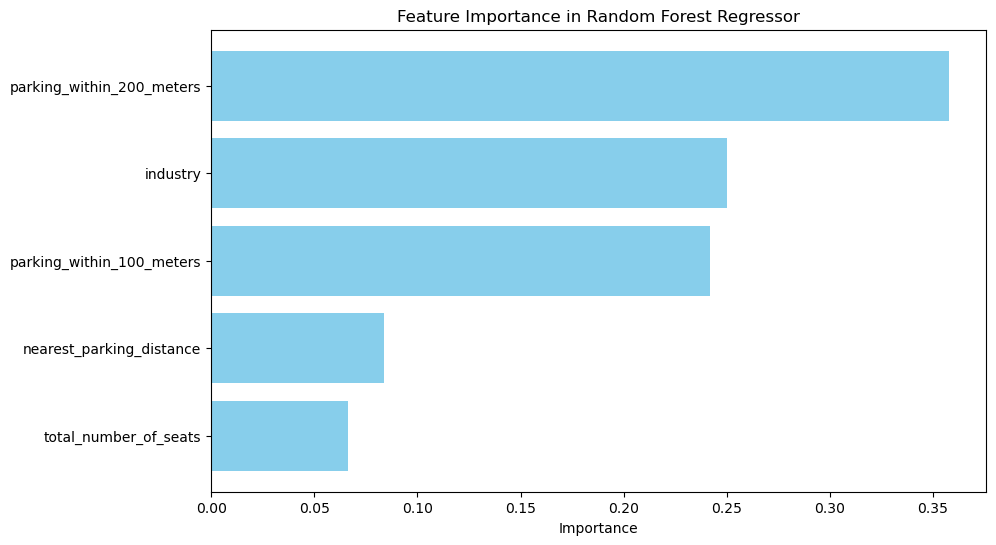

In [559]:
# Fit model
model = RandomForestRegressor(random_state=42)
model.fit(X_train, y_train)

# Predict
y_pred = model.predict(X_test)

# Evaluate
print(f'MSE: {mean_squared_error(y_test, y_pred)}')
print(f'R-squared: {r2_score(y_test, y_pred)}')

# Feature importance
importances = model.feature_importances_

# Create a DataFrame for feature importances
feature_importances_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# Plot feature importance
plt.figure(figsize=(10, 6))
plt.barh(feature_importances_df['Feature'], feature_importances_df['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.title('Feature Importance in Random Forest Regressor')
plt.gca().invert_yaxis()
plt.show()


For Precision and Simplicity:
Linear Regression is a strong choice if we require a model that provides precise predictions with a low MSE. It's also simpler and easier to interpret compared to more complex models.

For Classification:
Logistic Regression performs very well in classifying whether parking is sufficient or insufficient, with high accuracy, precision, recall, and F1-scores. It is recommended if you need to classify businesses into distinct parking sufficiency categories.

For Robust Performance and Feature Insights:
Random Forest Regressor is the best model if you need a more robust model that can capture complex relationships between features. Its higher R-squared indicates it explains more variance, and it provides valuable insights into which features drive parking accessibility the most.
Final Approach:

We can use Random Forest for exploratory analysis and feature importance, while applying Linear Regression for predicting actual accessibility scores and Logistic Regression for binary classification (sufficient/insufficient parking). This combined approach offers flexibility, allowing to leverage each model's strengths for different specific tasks usage.

<b>Implementing Deep learning approach using an FFNN to predict parking sufficiency

Parking accessibility prediction model by leveraging a Feedforward Neural Network (FFNN) for binary classification of parking sufficiency (sufficient vs. insufficient). This model will predict whether the parking accessibility score exceeds a defined threshold (e.g., 0.5). I introduced custom metrics such as Pearson Correlation and Euclidean Distance to provide additional insights into the model’s performance

Feedforward Neural Network (FFNN):

I build a 3-layer FFNN using the Keras library with TensorFlow backend:
Input layer with 64 neurons and ReLU activation.
Hidden layer with 32 neurons and ReLU activation.
Output layer with a single neuron using a sigmoid activation for binary classification.
The model is compiled with the Adam optimizer and binary crossentropy loss.I tracked accuracy during training and validation.

Early Stopping:
To prevent overfitting, early stopping is used, monitoring the validation loss and halting training if it doesn't improve after 5 epochs.

Model Training:

The model is trained for up to 100 epochs with a batch size of 32, and an 80-20 split is used for training and validation data.

Prediction and Evaluation:

After training, the model's predictions on the test set are generated and thresholded at 0.5 to convert the probabilities into binary labels.
Evaluated the model’s performance using accuracy, loss, and custom metrics.

In [565]:
# Custom metric: Pearson Correlation
def pearson_correlation(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    
    x_mean = K.mean(y_true)
    y_mean = K.mean(y_pred)
    x_var = K.mean(K.square(y_true - x_mean))
    y_var = K.mean(K.square(y_pred - y_mean))
    covariance = K.mean((y_true - x_mean) * (y_pred - y_mean))
    return covariance / (K.sqrt(x_var) * K.sqrt(y_var))

# Custom metric: Euclidean Distance
def euclidean_distance(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    return K.sqrt(K.sum(K.square(y_true - y_pred)))

# Prepare data
threshold = 0.5  # Adjust based on your data
cafes_gdf_copy['accessibility_binary'] = (cafes_gdf_copy['parking_accessibility_score'] > threshold).astype(int)
y = cafes_gdf_copy['accessibility_binary']

# Features for the model
features = ['Area', 'total_number_of_seats', 'latitude', 'longitude', 'nearest_parking_distance', 
            'parking_within_100_meters', 'parking_within_200_meters', 'industry']

# Feature matrix
X = cafes_gdf_copy[features]

# Scaling the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Build the FFNN model
model = Sequential()
model.add(Dense(64, input_dim=X_train.shape[1], activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

# Compile the model with custom metrics
model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])

# Print the model summary
model.summary()

# Early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Fit the model
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.2, verbose=1, callbacks=[early_stopping])

# Predict
y_pred_prob = model.predict(X_test)
y_pred = (y_pred_prob > 0.5).astype(int)

# Plot training and validation metrics
plt.figure(figsize=(14, 6))



C:\Users\chath\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_39 (Dense)                     │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_40 (Dense)                     │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_41 (Dense)                     │ (None, 1)                   │              33 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,689 (10.50 KB)

 Trainable params: 2,689 (10.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - accuracy: 0.6823 - loss: 0.5727 - val_accuracy: 0.9238 - val_loss: 0.3428
Epoch 2/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9327 - loss: 0.3164 - val_accuracy: 0.9589 - val_loss: 0.1862
Epoch 3/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9459 - loss: 0.1884 - val_accuracy: 0.9589 - val_loss: 0.1183
Epoch 4/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9638 - loss: 0.1175 - val_accuracy: 0.9765 - val_loss: 0.0847
Epoch 5/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9740 - loss: 0.0991 - val_accuracy: 0.9824 - val_loss: 0.0681
Epoch 6/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9815 - loss: 0.0754 - val_accuracy: 0.9853 - val_loss: 0.0585
Epoch 7/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9800 - loss: 0.0807 - val_accuracy: 0.9853 - val_loss: 0.0519
Epoch 8/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9841 - loss: 0.0638 - val_accuracy: 0.9912 - 

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<b> Evaluating FFNN

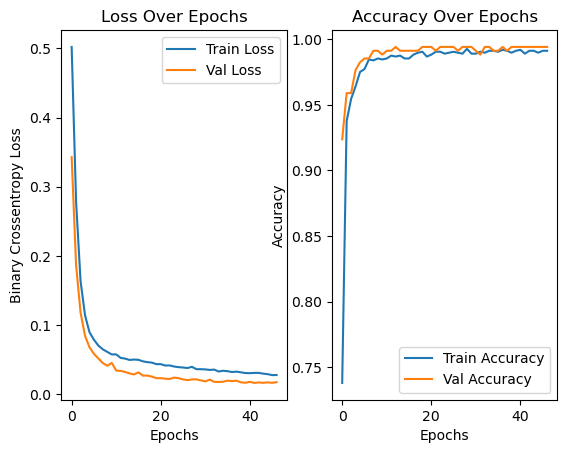

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9620 - loss: 0.0979 
Test loss: 0.06384347379207611
Test accuracy: 0.9789227247238159


In [569]:
# Plot Loss
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.xlabel('Epochs')
plt.ylabel('Binary Crossentropy Loss')
plt.title('Loss Over Epochs')
plt.legend()
# Plot Accuracy
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Epochs')
plt.legend()

plt.show()

# Evaluate the model
score = model.evaluate(X_test, y_test)
print('Test loss:', score[0])
print('Test accuracy:', score[1])



The FFNN results with a test loss of 0.0638 and test accuracy of 97.89% indicate that the model has performed very well on the classification task of predicting parking accessibility

<b>Outputs

<b> 1. A single data set for each business, details on the number of near by parking spots within 100 and 200 meters, distance for the nearest parking spot, Parking accessibility score and Catogerisation

In [590]:

# Drop 'Area', 'industry', and 'geometry' columns from business_gdf
business_df_final = business_gdf.drop(columns=['Area', 'industry', 'geometry' ])

business_df_final = business_df_final.merge(
    cafes_gdf_copy[[ 'trading_name', 'parking_accessibility_score', 'accessibility_category']],
    on=['trading_name'],
    how='left'
)

# Display first 10 rows 
display(business_df_final.head(10).style.set_table_attributes("style='display:inline'").set_caption('Business Parking Accessibility Data'))




,clue_small_area,trading_name,industry_description,longitude,latitude,total_number_of_seats,nearest_parking_distance,nearest_parking_name,parking_within_100_meters,parking_within_200_meters,parking_accessibility_score,accessibility_category
0,Docklands,Yassas,Cafes and Restaurants,144.936589,-37.811859,484,102.276287,"Pearl River Road between Footscray Road and Docklands Drive, approximately 19m South of Harbour Town West Car Park, Ground 88 Pearl River Road DOCKLANDS VIC 3008",0,10,0.311828,Low Accessibility
1,Docklands,Fukutontei Ramen,Cafes and Restaurants,144.936589,-37.811859,484,102.276287,"Pearl River Road between Footscray Road and Docklands Drive, approximately 19m South of Harbour Town West Car Park, Ground 88 Pearl River Road DOCKLANDS VIC 3008",0,10,0.311828,Low Accessibility
2,Docklands,Carl's Jr Docklands,Cafes and Restaurants,144.936589,-37.811859,484,102.276287,"Pearl River Road between Footscray Road and Docklands Drive, approximately 19m South of Harbour Town West Car Park, Ground 88 Pearl River Road DOCKLANDS VIC 3008",0,10,0.311828,Low Accessibility
3,Docklands,8 Street Docklands,Cafes and Restaurants,144.936589,-37.811859,484,102.276287,"Pearl River Road between Footscray Road and Docklands Drive, approximately 19m South of Harbour Town West Car Park, Ground 88 Pearl River Road DOCKLANDS VIC 3008",0,10,0.311828,Low Accessibility
4,Docklands,The Pancake Parlour,Cafes and Restaurants,144.936589,-37.811859,484,102.276287,"Pearl River Road between Footscray Road and Docklands Drive, approximately 19m South of Harbour Town West Car Park, Ground 88 Pearl River Road DOCKLANDS VIC 3008",0,10,0.311828,Low Accessibility
5,Docklands,Them Authentic Vietnamese Cuisine & Rolls,Cafes and Restaurants,144.952479,-37.822884,196,33.509372,Siddeley Street between Spencer Street and Wurundjeri Way,10,16,0.365030,Low Accessibility
6,Docklands,Hanoi Square,Cafes and Restaurants,144.952479,-37.822884,196,33.509372,Siddeley Street between Spencer Street and Wurundjeri Way,10,16,0.365030,Low Accessibility
7,Docklands,Bababoi,Cafes and Restaurants,144.952479,-37.822884,196,33.509372,Siddeley Street between Spencer Street and Wurundjeri Way,10,16,0.365030,Low Accessibility
8,Docklands,Perso,Cafes and Restaurants,144.952479,-37.822884,196,33.509372,Siddeley Street between Spencer Street and Wurundjeri Way,10,16,0.365030,Low Accessibility
9,North Melbourne,Melbourne Kebab Box,Takeaway Food Services,144.940961,-37.789743,10,187.653687,"Flemington Road between Racecourse Road and Melrose Street, approximately 54m NE of Tomkin Australia Pty Ltd, Gnd & Flr1 371-377 Flemington Road NORTH MELBOURNE VIC 3051",0,1,0.037057,Low Accessibility


<b> 2. Map of parking availability: Visualize parking availability by plotting parking bays/meters on a map and overlaying it with closest 5 business locations

In [580]:

# Create GeoDataFrames
def create_geodataframes(cafes_and_bars_df, parking_df):
    cafes_gdf = gpd.GeoDataFrame(cafes_and_bars_df, geometry=gpd.points_from_xy(cafes_and_bars_df.longitude, cafes_and_bars_df.latitude))
    parking_gdf = gpd.GeoDataFrame(parking_df, geometry=gpd.points_from_xy(parking_df.longitude, parking_df.latitude))
    return cafes_gdf, parking_gdf

# Function to find the 5 nearest parking locations
def find_nearest_parking(trading_name, cafes_gdf, parking_gdf, num_nearest=5):
    venue = cafes_gdf[cafes_gdf['trading_name'] == trading_name]
    
    if venue.empty:
        return pd.DataFrame()  # Return an empty DataFrame if no matching venue is found
    
    venue_coords = (venue.geometry.y.values[0], venue.geometry.x.values[0])  # Correct order: (latitude, longitude)
    
    def calculate_distance(parking_geom):
        parking_coords = (parking_geom.y, parking_geom.x)  # Correct order: (latitude, longitude)
        return great_circle(venue_coords, parking_coords).meters
    
    parking_gdf['distance'] = parking_gdf.geometry.apply(calculate_distance)
    nearest_parkings = parking_gdf.nsmallest(num_nearest, 'distance')
    
    return nearest_parkings[['latitude', 'longitude', 'distance', 'location']]

# Function to plot map with all nearest parking locations, a line to the closest one, and a legend
def plot_map(trading_name):
    nearest_parkings = find_nearest_parking(trading_name, cafes_gdf, parking_gdf)
    
    if nearest_parkings.empty:
        return None, nearest_parkings  # Return None for the map if no nearest parkings found
    
    venue = cafes_gdf[cafes_gdf['trading_name'] == trading_name]
    venue_coords = (venue.geometry.y.values[0], venue.geometry.x.values[0])
    
    # Initialize map centered around the venue
    m = folium.Map(location=[venue_coords[0], venue_coords[1]], zoom_start=15)
    
    # Add venue marker
    folium.Marker(
        location=[venue_coords[0], venue_coords[1]],
        popup=f"Venue: {trading_name}",
        icon=folium.Icon(color='blue', icon='info-sign')
    ).add_to(m)
    
    # Add all nearest parking locations markers
    for _, row in nearest_parkings.iterrows():
        folium.Marker(
            location=[row.latitude, row.longitude],
            popup=f"Parking Distance: {row.distance:.2f} meters\nLocation: {row.location}",
            icon=folium.Icon(color='green', icon='info-sign')
        ).add_to(m)
    
    # Determine the nearest parking location
    closest_parking = nearest_parkings.iloc[0]
    parking_coords = [closest_parking['latitude'], closest_parking['longitude']]
    
    # Draw line from venue to the closest parking location
    folium.PolyLine(
        locations=[venue_coords, parking_coords],
        color='red',
        weight=2,
        opacity=0.8
    ).add_to(m)
    
    # Add distance label on the line
    midpoint = [(venue_coords[0] + closest_parking['latitude']) / 2, (venue_coords[1] + closest_parking['longitude']) / 2]
    folium.Marker(
        location=midpoint,
        icon=folium.DivIcon(html=f'<div style="font-size: 12px; color: black;">{closest_parking["distance"]:.2f} m</div>'),
        opacity=1
    ).add_to(m)
    
    return m, nearest_parkings

# Function to update the display
def update_location(trading_name):
    with output:
        clear_output(wait=True)
        
        # Fetch map and nearest parkings
        map_, nearest_parkings = plot_map(trading_name)
        
        # Display nearest parking locations details
        if not nearest_parkings.empty:
            print(f"Nearest 5 parking locations for '{trading_name}':")
            for _, row in nearest_parkings.iterrows():
                print(f"Latitude: {row.latitude}, Longitude: {row.longitude}, Distance: {row.distance:.2f} meters, Location: {row.location}")
        else:
            print("No parking locations found.")
        
        # Display map
        if map_:
            display(map_)
        else:
            print("No map available.")

# Create GeoDataFrames
cafes_gdf, parking_gdf = create_geodataframes(cafes_and_bars_df, parking_df)

# Widget to select venue
venue_selector = widgets.Dropdown(
    options=[(row['trading_name'], row['trading_name']) for _, row in cafes_and_bars_df.iterrows()],
    description='Select Venue:',
)

# Button to update nearest parking locations
update_button = widgets.Button(
    description='Find Nearest Parking'
)

# Output widget for displaying results
output = widgets.Output()

# Function to handle button click
def on_button_click(b):
    update_location(venue_selector.value)

# Link button click event to function
update_button.on_click(on_button_click)

# Display widgets
display(venue_selector, update_button, output)


Dropdown(description='Select Venue:', options=(('Yassas', 'Yassas'), ('Fukutontei Ramen', 'Fukutontei Ramen'),…

Button(description='Find Nearest Parking', style=ButtonStyle())

Output()

### Findings



Using the 4 datasets, I created a single final dataset called Business parking accessibility data which has the  Area, Trading Name, Venue Latitude, venue Longitude, Industry , Neartest Parking Location, Distance to nearest Parking location, Number of seating Capacity, Number of parking spaces within 100m , Number of parking spaces within 200mm , parking accessibility score andparking accessibility catogery. These give all the necessary information needed to business owners or managers.<br>
Parking spots are unevenly distributed, with some locations having significant nearby parking and others being quite distant. This parking sufficiency affects customer convenience, potentially influencing business performance. The analysis revealed that the parking availability for businesses in the Docklands and North Melbourne areas is limited, often leading to "Low Accessibility" scores. Visualizing parking spots on a map highlighted the variability in parking infrastructure, providing insights for local authorities and business owners to potentially improve parking facilities or offer better guidance to customers.

<b>Further Applications</b><br> 
Policy Making: Local councils can use this data to make decisions about where to install more parking spots.<br>
Business Strategy: Businesses can strategize to increase foot traffic by improving signs or recommending alternative parking locations.



### References



City of Melbourne  https://www.melbourne.vic.gov.au/economic-development-strategy-2031<br>
Parking Management Strategies: Litman, Todd. "Parking Management: Strategies, Evaluation and Planning." Victoria Transport Policy Institute, 2023.https://vtpi.org/park_man.pdf<br>


